# Instâncias reais

* **timestamp**: observations timestamps loaded into pandas DataFrame as its index;
* **P-PDG**: pressure variable at the Permanent Downhole Gauge (PDG);
* **P-TPT**: pressure variable at the Temperature and Pressure Transducer (TPT);
* **T-TPT**: temperature variable at the Temperature and Pressure Transducer (TPT);
* **P-MON-CKP**: pressure variable upstream of the production choke (CKP);
* **T-JUS-CKP**: temperature variable downstream of the production choke (CKP);
* **P-JUS-CKGL**: pressure variable upstream of the gas lift choke (CKGL);
* **T-JUS-CKGL**: temperature variable upstream of the gas lift choke (CKGL);
* **QGL**: gas lift flow rate;
* **class**: observations labels associated with three types of periods (normal, fault transient, and faulty steady state).


* **label**: instance label (event type);
* **well**: well name. Hand-drawn and simulated instances have fixed names. Real instances have names masked with incremental id;
* **id**: instance identifier. Hand-drawn and simulated instances have incremental id. Each real instance has an id generated from its first timestamp.

In [1]:
import sys
import os
import pandas as pd
import numpy as np


import joblib
import pickle

from sklearn.model_selection import train_test_split
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler, MinMaxScaler

from sklearn.metrics  import average_precision_score, make_scorer, roc_curve,f1_score, precision_score, recall_score, fbeta_score, auc, roc_auc_score, accuracy_score, confusion_matrix, classification_report,precision_recall_curve
import seaborn as sns

import matplotlib.pyplot as plt

import shap

from pyod.models.ecod import ECOD

from pyod.models.suod import SUOD

from pyod.models.xgbod import XGBOD

from pyod.models.loda import LODA

from pyod.models.pca import PCA

from sklearn.neighbors import LocalOutlierFactor

from sklearn.manifold import TSNE
from mpl_toolkits.mplot3d import Axes3D

from sklearn.neighbors import LocalOutlierFactor

from sklearn.kernel_approximation import Nystroem
from sklearn.linear_model import SGDOneClassSVM
from sklearn.pipeline import make_pipeline
from sklearn.svm import OneClassSVM

import plotly.graph_objects as go

from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin


c:\Users\User\anaconda3\envs\PHD\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:

import plotly.graph_objects as go

In [3]:
def metrics(y_test, y_pred):
    cm = list()
    cm = confusion_matrix(y_test, y_pred)
    cm_df = pd.DataFrame(cm)                      
    plt.figure(figsize=(8,6))  
    sns.heatmap(cm_df, annot=True)
    print("Classification Report: \n", classification_report(y_test, y_pred, digits=5))  


    TN = cm[0][0]
    FP = cm[0][1]
    FN = cm[1][0]
    TP = cm[1][1]

    print("Specificity:", TN/(TN+FP))


    roc_auc = roc_auc_score(y_test, y_pred, multi_class = 'ovr', average=None)
    gini = 2*roc_auc -1
    print("Gini: ",gini)
    print("ROC AUC:: ",roc_auc)

In [4]:
class ToDataFrameTransformer(BaseEstimator, TransformerMixin):
    """
    Transformador para converter arrays NumPy em DataFrames, mantendo os nomes das colunas.
    """
    def __init__(self, columns=None):
        self.columns = columns
    
    def fit(self, X, y=None):
        # Não há nada para ajustar, apenas retorna o próprio objeto
        return self

    def transform(self, X):
        # Converte o array NumPy em DataFrame com os nomes das colunas fornecidos
        if self.columns is not None:
            return pd.DataFrame(X, columns=self.columns)
        return pd.DataFrame(X)

    def fit_transform(self, X, y=None):
        return self.fit(X, y).transform(X)

In [5]:
train = pd.read_parquet('./dataset/train_temp.parquet.gzip') 
test = pd.read_parquet('./dataset/test_temp.parquet.gzip') 

In [6]:
VARS = ['P-PDG', 'P-TPT', 'T-TPT', 'P-MON-CKP', 'T-JUS-CKP', 'P-JUS-CKGL', 'QGL']

In [7]:
train.head()

,P-PDG,P-TPT,T-TPT,P-MON-CKP,T-JUS-CKP,P-JUS-CKGL,QGL,timestamp,well,target
7365884,0.0,18433410.0,116.8718,9397031.0,74.80031,-300917.8,0.0,2014-01-24 09:33:03,WELL-00001,1
7365885,0.0,18433410.0,116.8718,9397031.0,74.80031,-300917.8,0.0,2014-01-24 09:33:04,WELL-00001,1
7365886,0.0,18433410.0,116.8718,9397032.0,74.80031,-300917.8,0.0,2014-01-24 09:33:05,WELL-00001,1
7365887,0.0,18433410.0,116.8718,9397033.0,74.80031,-300917.8,0.0,2014-01-24 09:33:06,WELL-00001,1
7365888,0.0,18433410.0,116.8718,9397033.0,74.80031,-300917.8,0.0,2014-01-24 09:33:07,WELL-00001,1


## Isolation Forest

In [8]:
with open('./models/pipeline_iForest.pkl', 'rb') as f:
    iforest = pickle.load(f) 

In [9]:
iforest

Pipeline(steps=[('scaler', StandardScaler()),
                ('to_dataframe',
                 ToDataFrameTransformer(columns=['P-PDG', 'P-TPT', 'T-TPT',
                                                 'P-MON-CKP', 'T-JUS-CKP',
                                                 'P-JUS-CKGL', 'QGL'])),
                ('estimator',
                 IsolationForest(contamination=0.01, max_features=0.7,
                                 n_estimators=256, random_state=42))])

In [10]:
y_pred = iforest.predict(test[VARS])
test['iForest'] = np.where(y_pred == -1, 1, 0)  

In [11]:
y_pred = iforest.predict(train[VARS])
train['iForest'] = np.where(y_pred == -1, 1, 0)  

In [12]:
test['scores_forest']=-iforest.decision_function(test[VARS])

In [13]:
train['scores_forest'] = -iforest.score_samples(train[VARS])

In [14]:
test['iForest'].value_counts()

iForest
0    1682648
1     539152
Name: count, dtype: int64

<Axes: xlabel='scores_forest', ylabel='Density'>

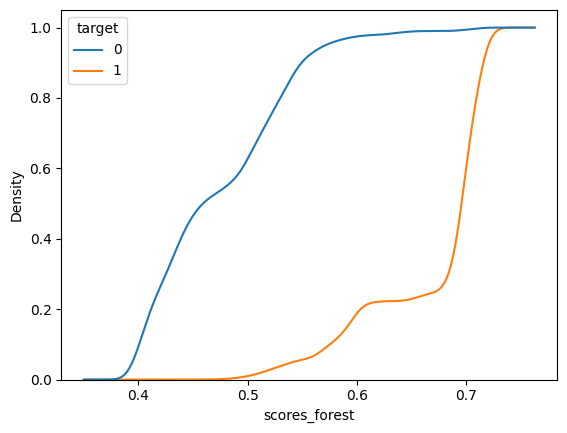

In [15]:
sns.kdeplot(
    data=train.sample(frac=0.01), x="scores_forest", hue=train.target,
    cumulative=True, common_norm=False, common_grid=True,
)

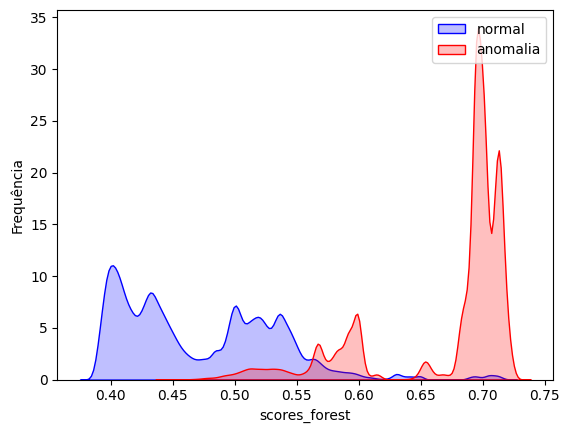

In [16]:
g = sns.kdeplot(train["scores_forest"][(train["target"] == 0) & (train["scores_forest"].notnull())], color="Blue", fill = True)
g = sns.kdeplot(train["scores_forest"][(train["target"] == 1) & (train["scores_forest"].notnull())], ax =g, color="Red", fill= True)

g.set_xlabel("scores_forest")
g.set_ylabel("Frequência")
g = g.legend(['normal', 'anomalia'])

<Axes: xlabel='scores_forest', ylabel='Density'>

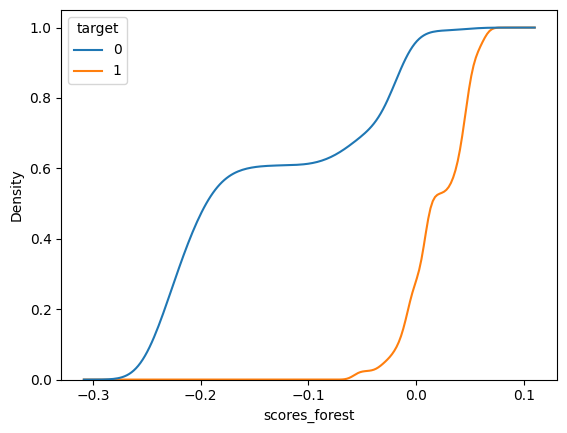

In [17]:
sns.kdeplot(
    data=test.sample(frac=0.01), x="scores_forest", hue=test.target,
    cumulative=True, common_norm=False, common_grid=True,
)

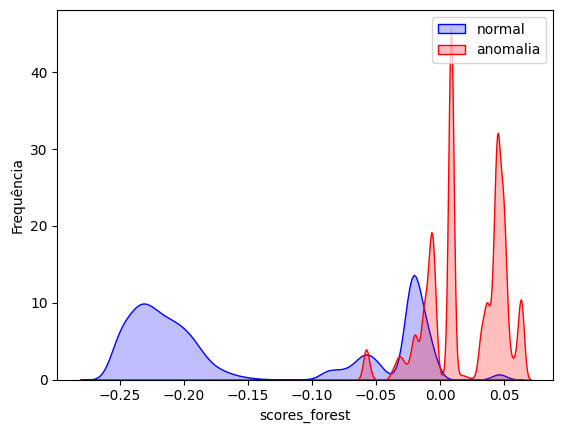

In [18]:
g = sns.kdeplot(test["scores_forest"][(test["target"] == 0) & (test["scores_forest"].notnull())], color="Blue", fill = True)
g = sns.kdeplot(test["scores_forest"][(test["target"] == 1) & (test["scores_forest"].notnull())], ax =g, color="Red", fill= True)

g.set_xlabel("scores_forest")
g.set_ylabel("Frequência")
g = g.legend(['normal', 'anomalia'])

### Metrics

Classification Report: 
               precision    recall  f1-score   support

           0    0.89587   0.99000   0.94059   5872276
           1    0.97552   0.77587   0.86432   3014901

    accuracy                        0.91736   8887177
   macro avg    0.93569   0.88294   0.90245   8887177
weighted avg    0.92289   0.91736   0.91471   8887177

Specificity: 0.99000268379756
Gini:  0.7658765847979576
ROC AUC::  0.8829382923989788


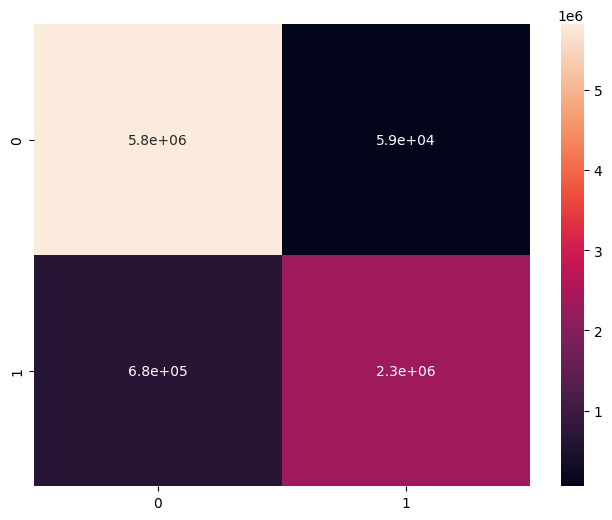

In [19]:
metrics(train.target, train.iForest)

Classification Report: 
               precision    recall  f1-score   support

           0    0.87907   0.99033   0.93138   1493608
           1    0.97320   0.72055   0.82803    728192

    accuracy                        0.90191   2221800
   macro avg    0.92613   0.85544   0.87971   2221800
weighted avg    0.90992   0.90191   0.89751   2221800

Specificity: 0.9903254401422595
Gini:  0.7108799092932527
ROC AUC::  0.8554399546466264


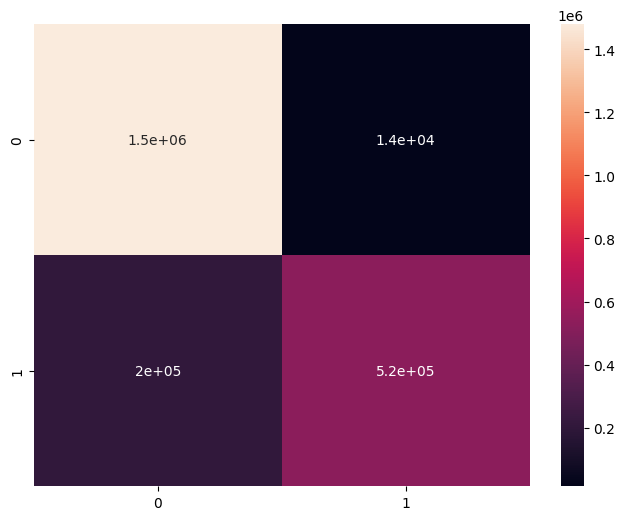

In [20]:
metrics(test.target, test.iForest)

### Explainable

In [21]:
test_sample = test.sample(frac=0.2, random_state=45)
test_sample_shap = test_sample[VARS]
test_sample_shap.shape

(444360, 7)

In [22]:
test_sample_shap.head()

,P-PDG,P-TPT,T-TPT,P-MON-CKP,T-JUS-CKP,P-JUS-CKGL,QGL
1365893,-6.887865e+06,9663066.0,118.4939,1590471.0,83.71794,-137539.4,0.0
10740299,-1.180116e+42,20787460.0,117.9016,10101000.0,70.89400,4048624.0,0.0
1472095,-6.887865e+06,9654070.0,118.4533,1424296.0,83.07838,-147999.8,0.0
10746609,-1.180116e+42,20787460.0,117.9162,10094150.0,70.92538,4061716.0,0.0
1631158,-6.887865e+06,9615695.0,118.4985,1213798.0,83.28349,-142259.4,0.0


In [23]:
exp = shap.TreeExplainer(iforest[2]) #Explainer
test_transform = iforest[1].transform((iforest[0].transform(test_sample_shap)))
shap_values = exp.shap_values(test_transform)  #Calculate SHAP values
shap.initjs()

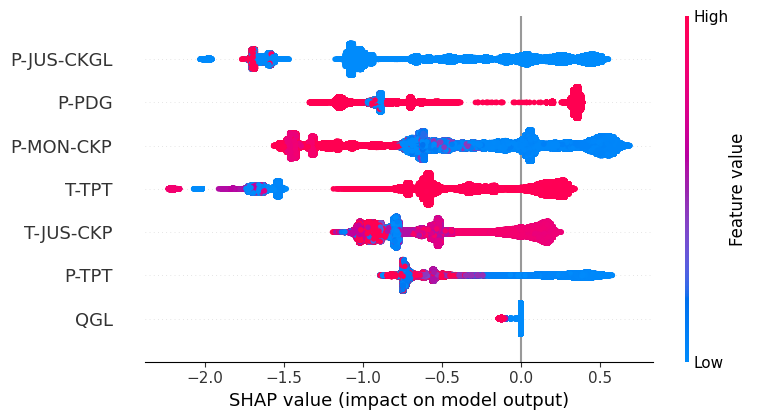

In [24]:
shap.summary_plot(shap_values, test_transform)

In [25]:
test_sample_shap.head(5)

,P-PDG,P-TPT,T-TPT,P-MON-CKP,T-JUS-CKP,P-JUS-CKGL,QGL
1365893,-6.887865e+06,9663066.0,118.4939,1590471.0,83.71794,-137539.4,0.0
10740299,-1.180116e+42,20787460.0,117.9016,10101000.0,70.89400,4048624.0,0.0
1472095,-6.887865e+06,9654070.0,118.4533,1424296.0,83.07838,-147999.8,0.0
10746609,-1.180116e+42,20787460.0,117.9162,10094150.0,70.92538,4061716.0,0.0
1631158,-6.887865e+06,9615695.0,118.4985,1213798.0,83.28349,-142259.4,0.0


In [26]:
shap.force_plot(exp.expected_value, shap_values[242],features =test_transform.iloc[242,:] ,feature_names =test_transform.columns)

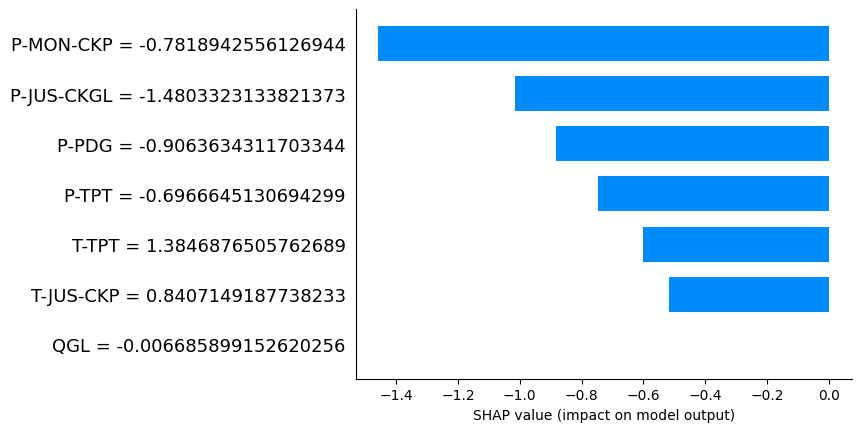

In [27]:
shap.bar_plot(shap_values[3],features =test_transform.iloc[2,:] ,feature_names =test_transform.columns)

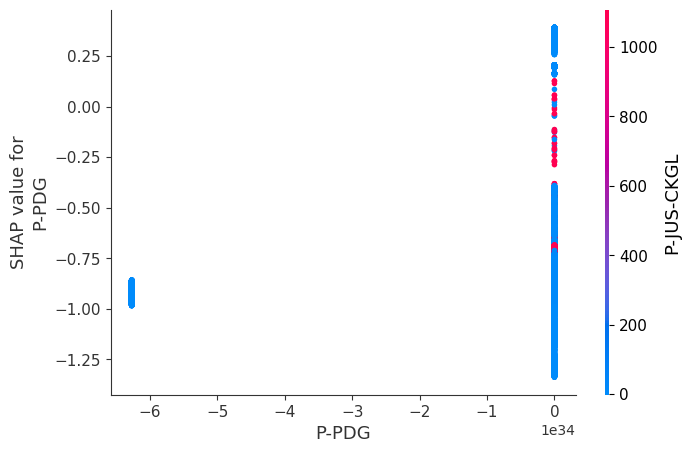

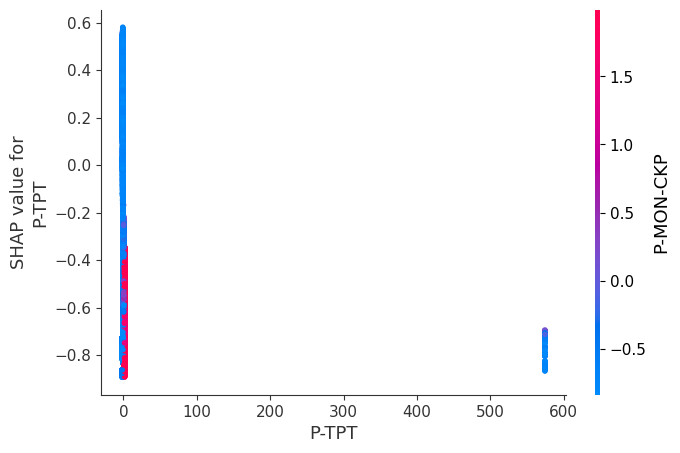

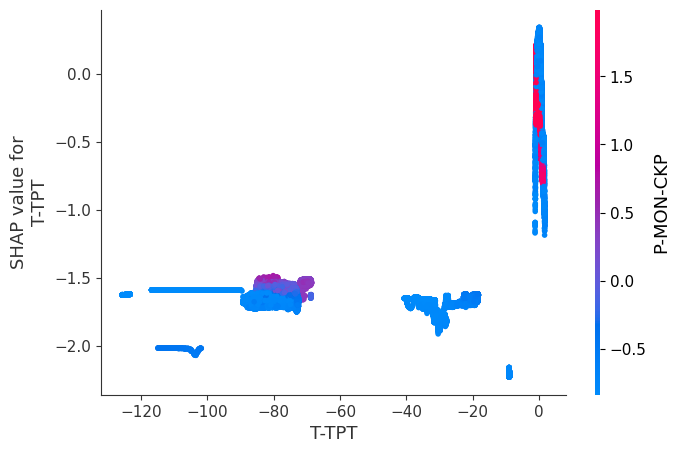

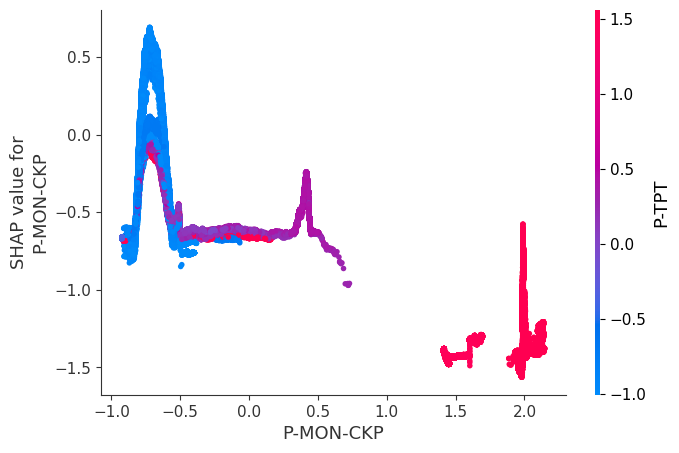

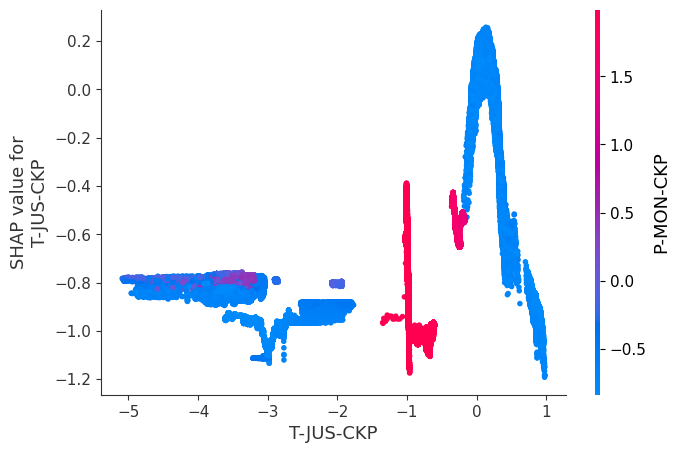

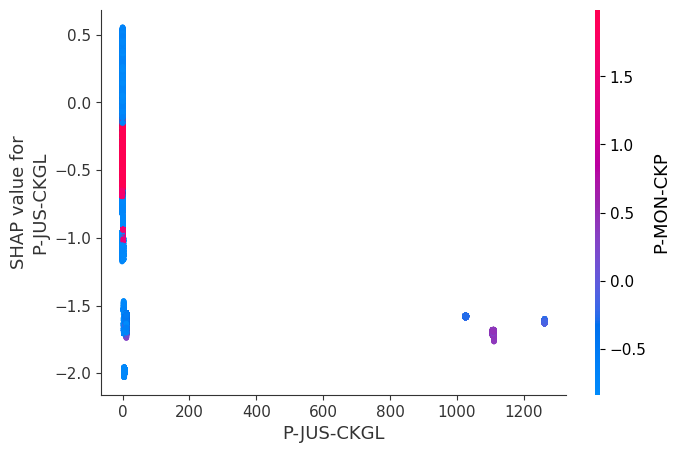

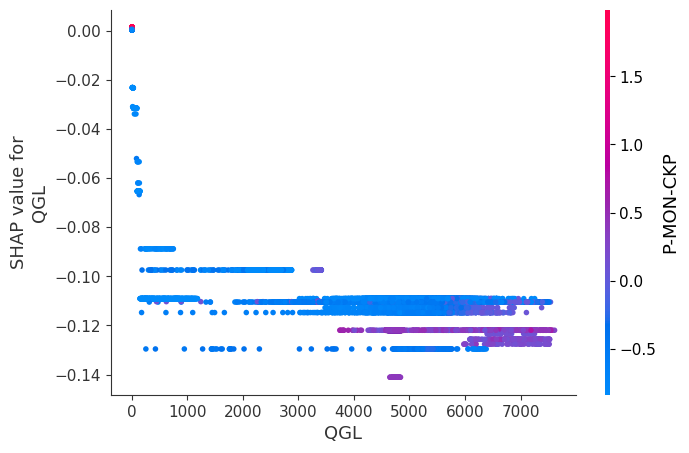

In [28]:
for i in range(0, 7):
    shap.dependence_plot(i, shap_values, test_transform)
    plt.show()

In [46]:
np.linspace(2, 4, 3)

array([2., 3., 4.])

    lambda    L  ARL_Control  MRL_Control  SRL_Control  ARL_Anomalous  \
0     0.10  2.0        950.0        950.0          0.0           50.0   
1     0.10  3.0        950.0        950.0          0.0           50.0   
2     0.10  4.0        950.0        950.0          0.0           50.0   
3     0.15  2.0        475.0        475.0        154.0           50.0   
4     0.15  3.0        950.0        950.0          0.0           50.0   
5     0.15  4.0        950.0        950.0          0.0           50.0   
6     0.20  2.0        950.0        950.0          0.0           50.0   
7     0.20  3.0        950.0        950.0          0.0           50.0   
8     0.20  4.0        950.0        950.0          0.0           50.0   
9     0.25  2.0        950.0        950.0          0.0           50.0   
10    0.25  3.0        950.0        950.0          0.0           50.0   
11    0.25  4.0        950.0        950.0          0.0           50.0   
12    0.30  2.0        950.0        950.0          

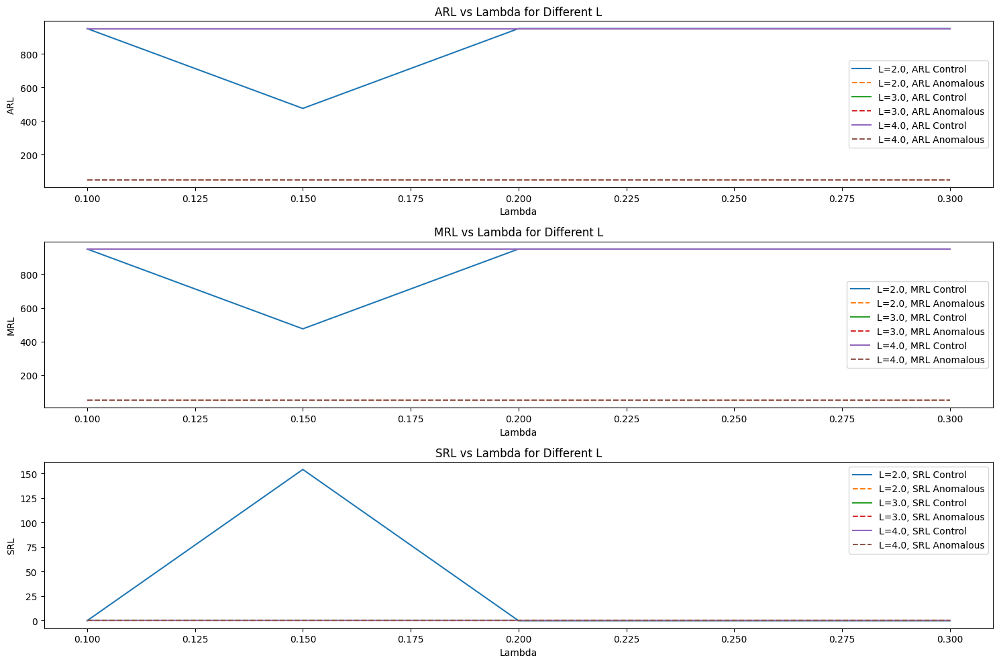

In [52]:
import numpy as np
import pandas as pd
from sklearn.ensemble import IsolationForest
import matplotlib.pyplot as plt

# Método para classificar os pontos com base nos limites de controle
def classify_points(scores, ewma, ucl, lcl):
    categories = []
    for i in range(len(scores)):
        if ewma[i] > ucl[i]:
            categories.append('Anomalous')
        elif ewma[i] < lcl[i]:
            categories.append('Normal')
        else:
            categories.append('Attention Needed')
    return categories

# Gerar dados de séries temporais sob controle e com anomalias
np.random.seed(0)
data_normal = np.random.normal(loc=0, scale=1, size=950)  # Dados normais
data_anomalous = np.random.normal(loc=5, scale=1, size=50)  # Dados anômalos
data = np.concatenate([data_normal, data_anomalous])

# Treinar o Isolation Forest em dados normais
model = IsolationForest(contamination=0.05, random_state=42)
model.fit(data_normal.reshape(-1, 1))

# Calcular os scores de anomalia
scores = model.decision_function(data.reshape(-1, 1))

# Parâmetros para simulação
lambdas = np.linspace(0.1, 0.3, 5)  # 5 valores diferentes de lambda
Ls = np.linspace(2, 4, 3)  # 3 valores diferentes de L

results = []

# Realizar simulações
for lambda_ in lambdas:
    for L in Ls:
        # Calcular EWMA dos scores
        ewma = np.zeros_like(scores)
        ewma[0] = scores[0]
        for i in range(1, len(scores)):
            ewma[i] = lambda_ * scores[i] + (1 - lambda_) * ewma[i-1]

        # Calcular média e desvio padrão dos escores sob controle
        mu = np.mean(scores[:950])
        sigma = np.std(scores[:950])

        # Calcular limites de controle para EWMA
        n = len(ewma)
        ucl = mu + L * sigma * np.sqrt((lambda_ / (2 - lambda_)) * (1 - (1 - lambda_)**(2 * (np.arange(n) + 1))))
        lcl = mu - L * sigma * np.sqrt((lambda_ / (2 - lambda_)) * (1 - (1 - lambda_)**(2 * (np.arange(n) + 1))))

        # Classificar os pontos com base nos limites de controle
        categories = classify_points(scores, ewma, ucl, lcl)

        # Calcular os Run Lengths para dados sob controle
        run_lengths_control = []
        run_length = 0
        for i in range(len(categories[:950])):  # Apenas dados sob controle
            run_length += 1
            if categories[i] == 'Anomalous':
                run_lengths_control.append(run_length)
                run_length = 0

        # Caso não haja anomalias detectadas até o final da série sob controle
        if run_length != 0:
            run_lengths_control.append(run_length)

        # Calcular ARL, MRL e SRL para dados sob controle
        arl_control = np.mean(run_lengths_control)
        mrl_control = np.median(run_lengths_control)
        srl_control = np.std(run_lengths_control)

        # Calcular os Run Lengths para dados fora de controle
        run_lengths_anomalous = []
        run_length = 0
        for i in range(950, len(categories)):  # Apenas dados fora de controle
            run_length += 1
            if categories[i] == 'Anomalous':
                run_lengths_anomalous.append(run_length)
                run_length = 0

        # Caso não haja anomalias detectadas até o final da série fora de controle
        if run_length != 0:
            run_lengths_anomalous.append(run_length)

        # Calcular ARL, MRL e SRL para dados fora de controle
        arl_anomalous = np.mean(run_lengths_anomalous)
        mrl_anomalous = np.median(run_lengths_anomalous)
        srl_anomalous = np.std(run_lengths_anomalous)

        results.append({
            'lambda': lambda_,
            'L': L,
            'ARL_Control': arl_control,
            'MRL_Control': mrl_control,
            'SRL_Control': srl_control,
            'ARL_Anomalous': arl_anomalous,
            'MRL_Anomalous': mrl_anomalous,
            'SRL_Anomalous': srl_anomalous
        })

# Converter resultados para DataFrame
results_df = pd.DataFrame(results)

# Exibir a tabela de resultados
print(results_df)

# Plotar os gráficos das métricas
plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
for L in Ls:
    subset = results_df[results_df['L'] == L]
    plt.plot(subset['lambda'], subset['ARL_Control'], label=f'L={L}, ARL Control')
    plt.plot(subset['lambda'], subset['ARL_Anomalous'], label=f'L={L}, ARL Anomalous', linestyle='--')
plt.xlabel('Lambda')
plt.ylabel('ARL')
plt.legend()
plt.title('ARL vs Lambda for Different L')

plt.subplot(3, 1, 2)
for L in Ls:
    subset = results_df[results_df['L'] == L]
    plt.plot(subset['lambda'], subset['MRL_Control'], label=f'L={L}, MRL Control')
    plt.plot(subset['lambda'], subset['MRL_Anomalous'], label=f'L={L}, MRL Anomalous', linestyle='--')
plt.xlabel('Lambda')
plt.ylabel('MRL')
plt.legend()
plt.title('MRL vs Lambda for Different L')

plt.subplot(3, 1, 3)
for L in Ls:
    subset = results_df[results_df['L'] == L]
    plt.plot(subset['lambda'], subset['SRL_Control'], label=f'L={L}, SRL Control')
    plt.plot(subset['lambda'], subset['SRL_Anomalous'], label=f'L={L}, SRL Anomalous', linestyle='--')
plt.xlabel('Lambda')
plt.ylabel('SRL')
plt.legend()
plt.title('SRL vs Lambda for Different L')

plt.tight_layout()
plt.show()



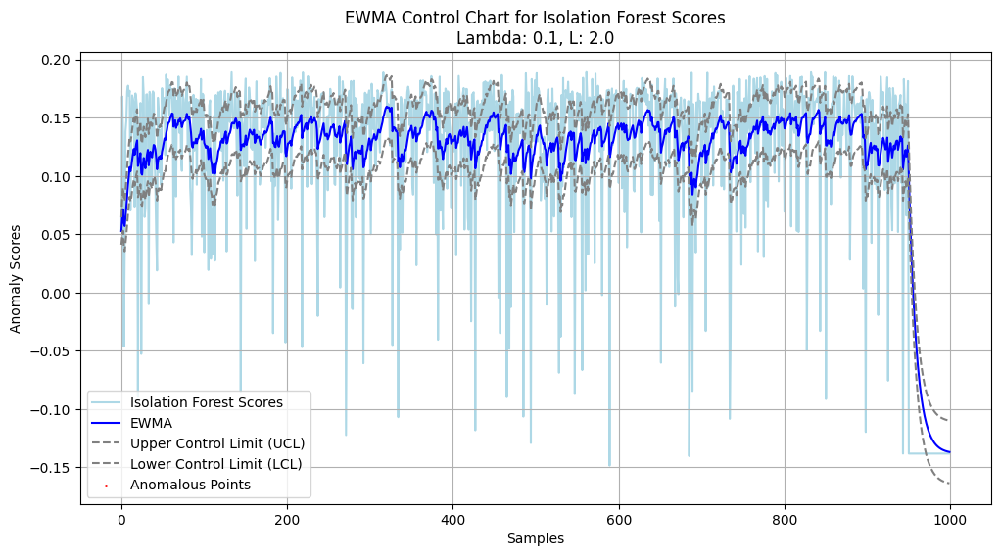

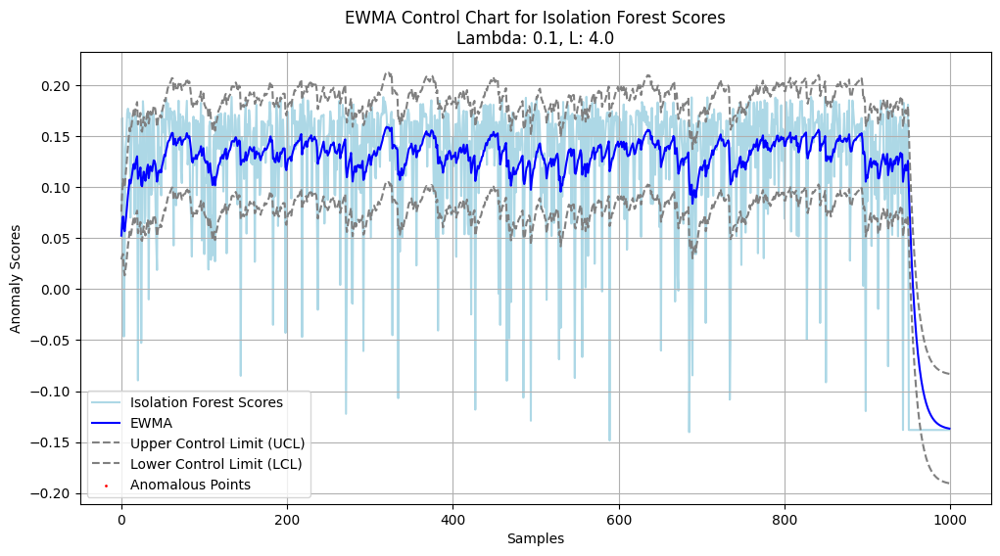

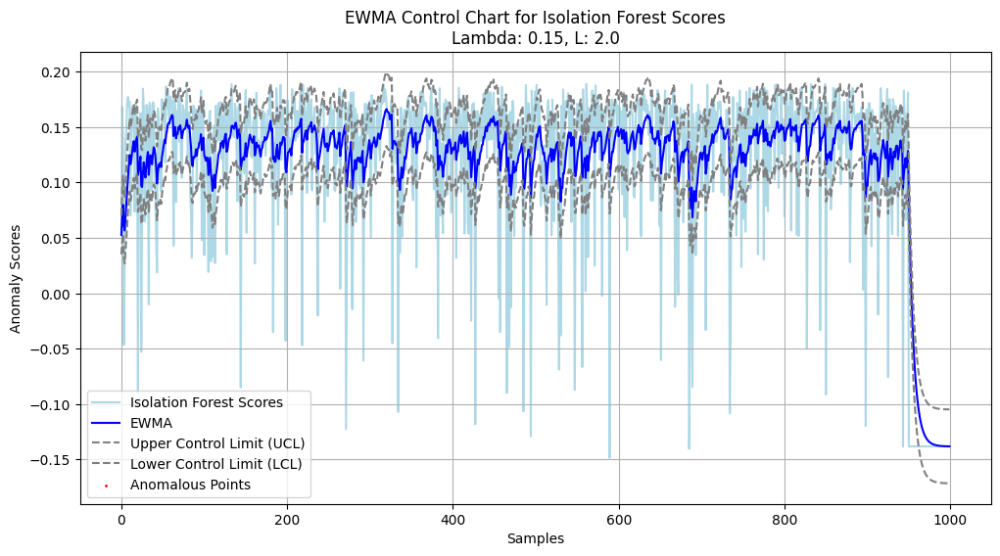

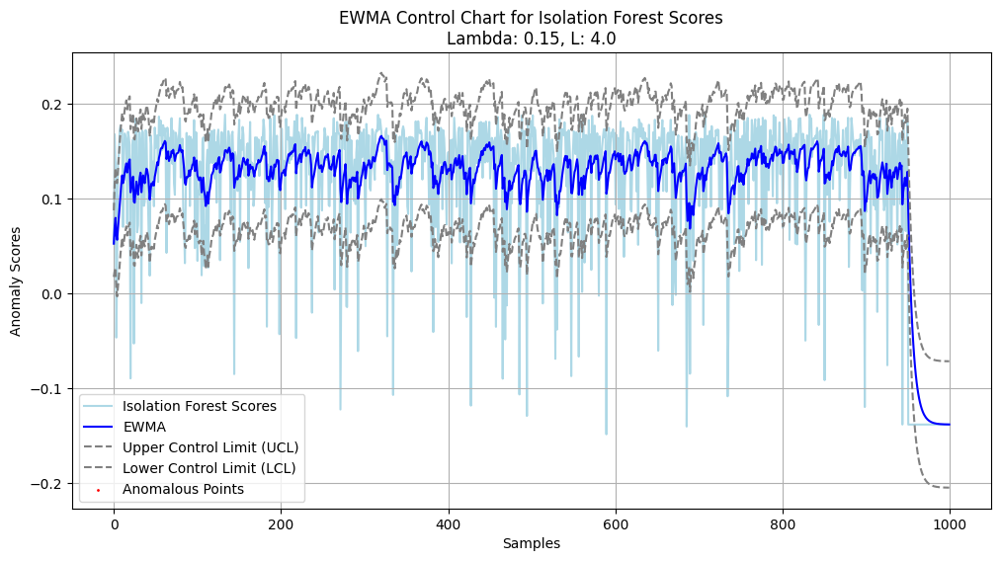

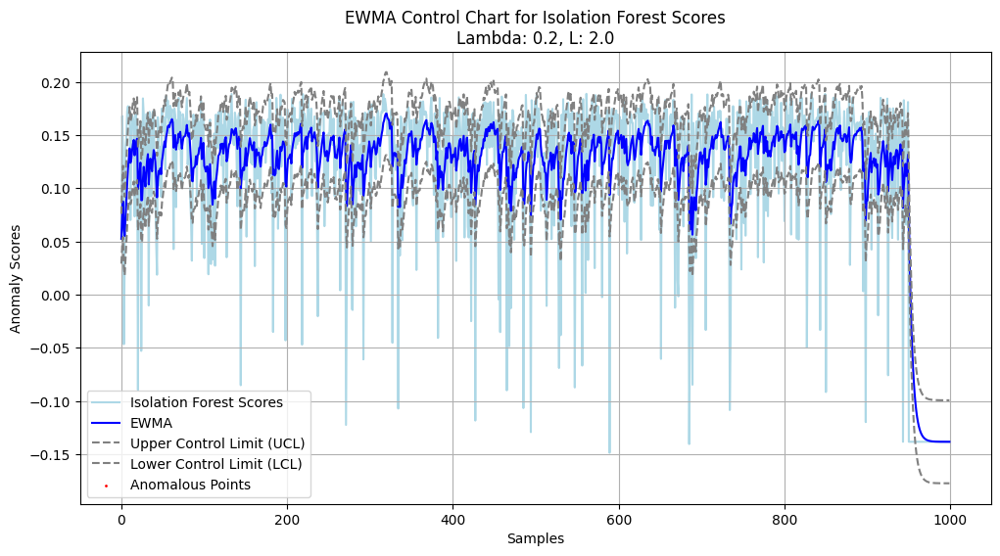

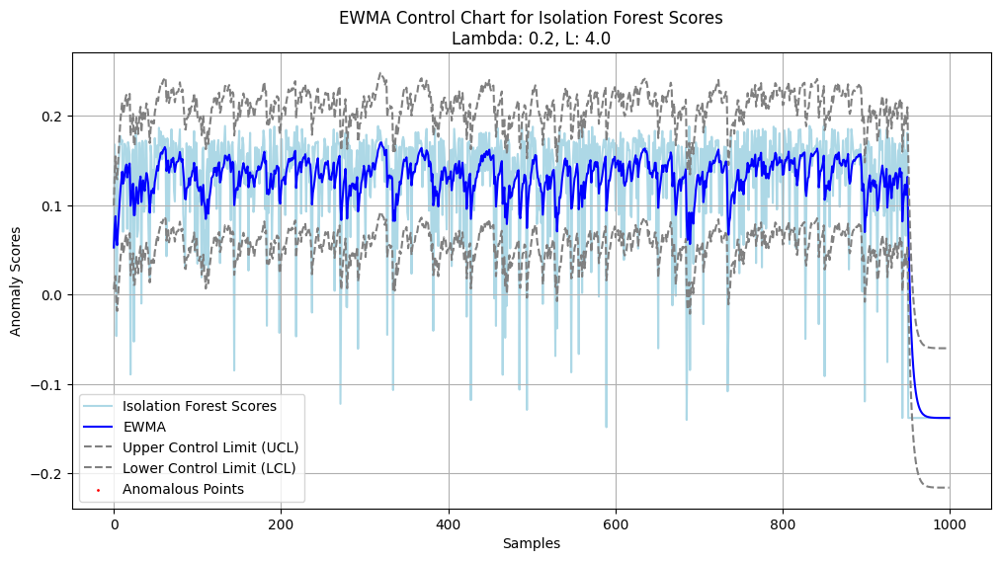

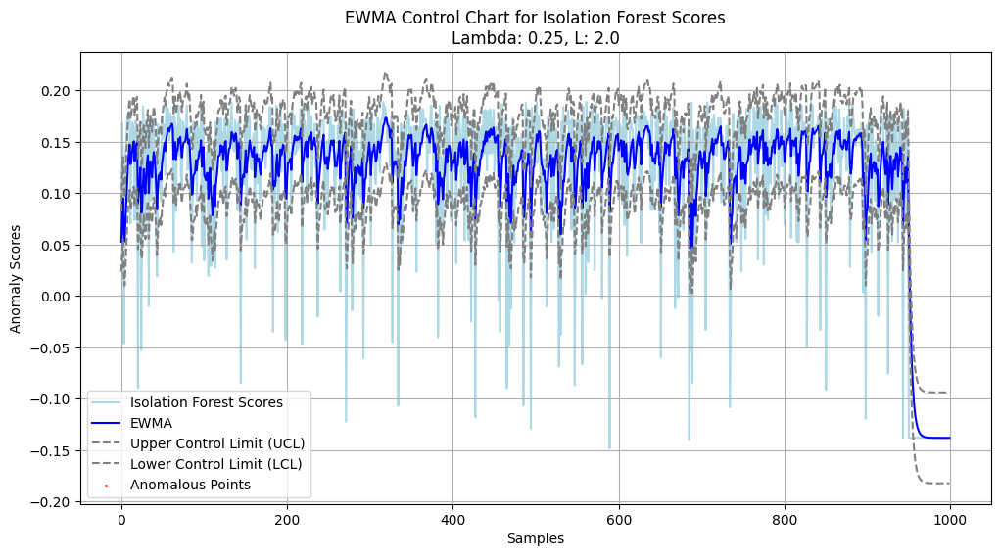

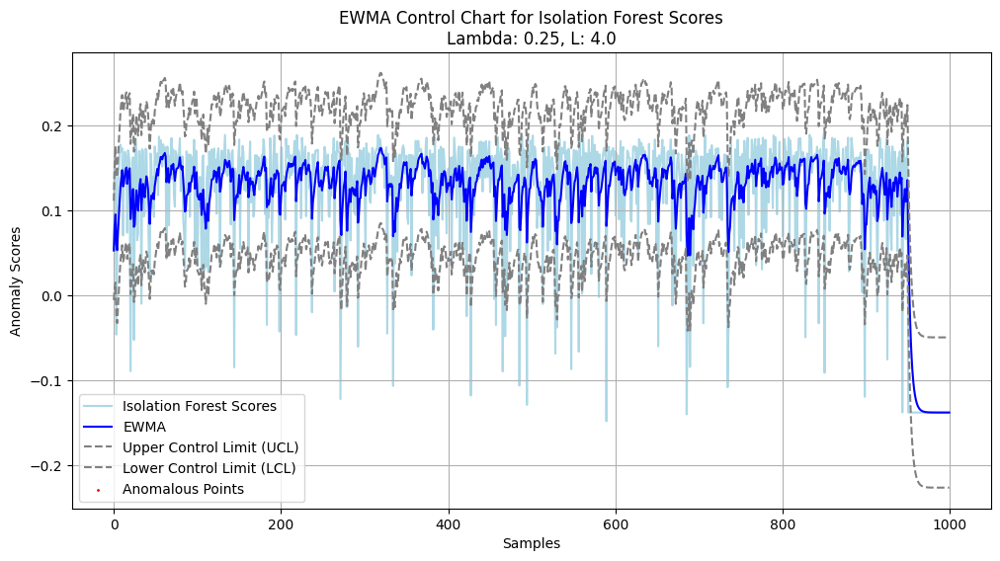

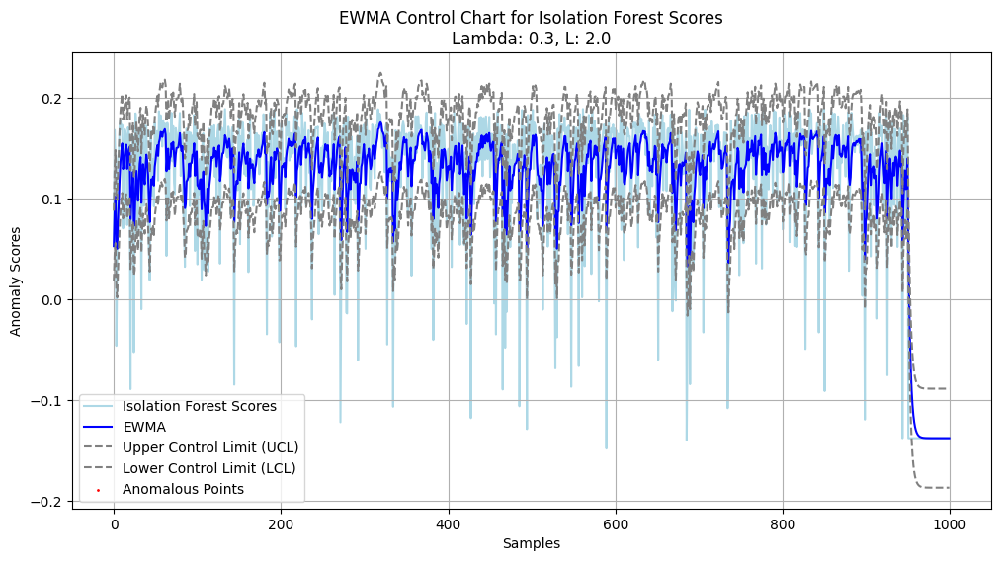

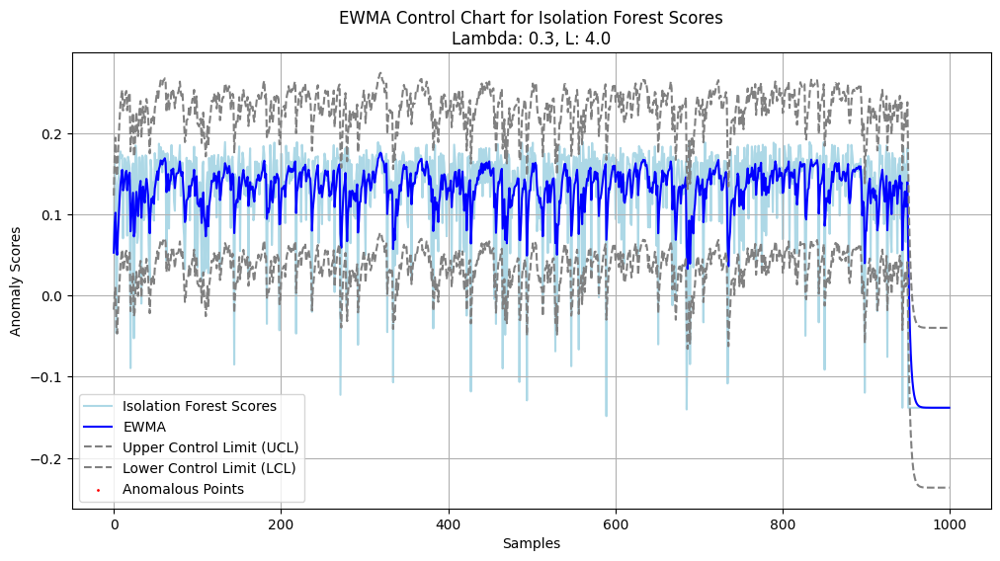

   lambda    L  ARL_Control  MRL_Control  SRL_Control  ARL_Anomalous  \
0    0.10  2.0        950.0        950.0          0.0           50.0   
1    0.10  4.0        950.0        950.0          0.0           50.0   
2    0.15  2.0        950.0        950.0          0.0           50.0   
3    0.15  4.0        950.0        950.0          0.0           50.0   
4    0.20  2.0        950.0        950.0          0.0           50.0   
5    0.20  4.0        950.0        950.0          0.0           50.0   
6    0.25  2.0        950.0        950.0          0.0           50.0   
7    0.25  4.0        950.0        950.0          0.0           50.0   
8    0.30  2.0        950.0        950.0          0.0           50.0   
9    0.30  4.0        950.0        950.0          0.0           50.0   

   MRL_Anomalous  SRL_Anomalous  
0           50.0            0.0  
1           50.0            0.0  
2           50.0            0.0  
3           50.0            0.0  
4           50.0            0.0  
5  

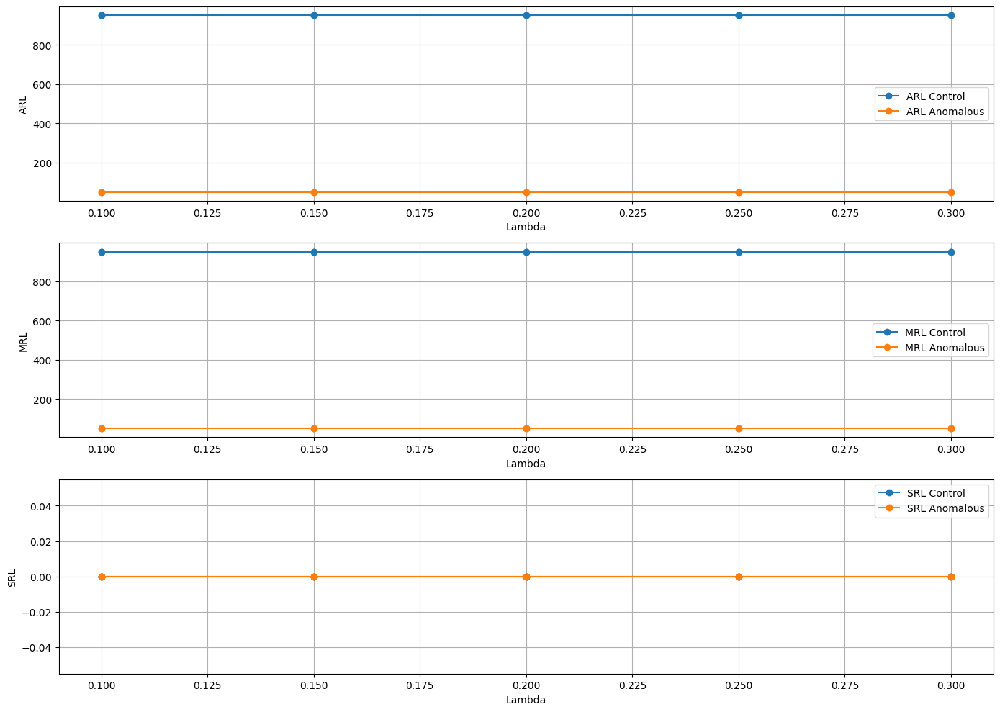

In [54]:
import numpy as np
import pandas as pd
from sklearn.ensemble import IsolationForest
import matplotlib.pyplot as plt

# Método para classificar os pontos com base nos limites de controle
def classify_points(scores, ewma, ucl, lcl):
    categories = []
    for i in range(len(scores)):
        if ewma[i] > ucl[i]:
            categories.append('Anomalous')
        elif ewma[i] < lcl[i]:
            categories.append('Normal')
        else:
            categories.append('Attention Needed')
    return categories

# Gerar dados de séries temporais sob controle e com anomalias
np.random.seed(0)
data_normal = np.random.normal(loc=0, scale=1, size=950)  # Dados normais
data_anomalous = np.random.normal(loc=5, scale=1, size=50)  # Dados anômalos
data = np.concatenate([data_normal, data_anomalous])

# Treinar o Isolation Forest em dados normais
model = IsolationForest(contamination=0.05, random_state=42)
model.fit(data_normal.reshape(-1, 1))

# Calcular os scores de anomalia
scores = model.decision_function(data.reshape(-1, 1))

# Parâmetros para simulação
lambdas = np.linspace(0.1, 0.3, 5)  # 5 valores diferentes de lambda
Ls = np.linspace(2, 4, 2)  # 2 valores diferentes de L

results = []

# Realizar simulações
for lambda_ in lambdas:
    for L in Ls:
        # Calcular EWMA dos scores
        ewma = np.zeros_like(scores)
        ewma[0] = scores[0]
        for i in range(1, len(scores)):
            ewma[i] = lambda_ * scores[i] + (1 - lambda_) * ewma[i-1]

        # Calcular desvio padrão dos escores sob controle
        sigma = np.std(scores[:950])

        # Calcular limites de controle para EWMA
        n = len(ewma)
        ucl = ewma + L * sigma * np.sqrt((lambda_ / (2 - lambda_)) * (1 - (1 - lambda_)**(2 * (np.arange(n) + 1))))
        lcl = ewma - L * sigma * np.sqrt((lambda_ / (2 - lambda_)) * (1 - (1 - lambda_)**(2 * (np.arange(n) + 1))))

        # Classificar os pontos com base nos limites de controle
        categories = classify_points(scores, ewma, ucl, lcl)

        # Calcular os Run Lengths para dados sob controle
        run_lengths_control = []
        run_length = 0
        for i in range(len(categories[:950])):  # Apenas dados sob controle
            run_length += 1
            if categories[i] == 'Anomalous':
                run_lengths_control.append(run_length)
                run_length = 0

        # Caso não haja anomalias detectadas até o final da série sob controle
        if run_length != 0:
            run_lengths_control.append(run_length)

        # Calcular ARL, MRL e SRL para dados sob controle
        arl_control = np.mean(run_lengths_control)
        mrl_control = np.median(run_lengths_control)
        srl_control = np.std(run_lengths_control)

        # Calcular os Run Lengths para dados fora de controle
        run_lengths_anomalous = []
        run_length = 0
        for i in range(950, len(categories)):  # Apenas dados fora de controle
            run_length += 1
            if categories[i] == 'Anomalous':
                run_lengths_anomalous.append(run_length)
                run_length = 0

        # Caso não haja anomalias detectadas até o final da série fora de controle
        if run_length != 0:
            run_lengths_anomalous.append(run_length)

        # Calcular ARL, MRL e SRL para dados fora de controle
        arl_anomalous = np.mean(run_lengths_anomalous)
        mrl_anomalous = np.median(run_lengths_anomalous)
        srl_anomalous = np.std(run_lengths_anomalous)

        results.append({
            'lambda': lambda_,
            'L': L,
            'ARL_Control': arl_control,
            'MRL_Control': mrl_control,
            'SRL_Control': srl_control,
            'ARL_Anomalous': arl_anomalous,
            'MRL_Anomalous': mrl_anomalous,
            'SRL_Anomalous': srl_anomalous
        })

        # Plotar os gráficos de controle EWMA para os escores do Isolation Forest
        plt.figure(figsize=(12, 6))
        plt.plot(scores, label='Isolation Forest Scores', color='lightblue', zorder=1)
        plt.plot(ewma, label='EWMA', color='blue', zorder=2)
        plt.plot(ucl, 'r--', label='Upper Control Limit (UCL)', color='gray', zorder=3)
        plt.plot(lcl, 'r--', label='Lower Control Limit (LCL)', color='gray', zorder=3)
        anomalous_indices = [i for i in range(len(categories)) if categories[i] == 'Anomalous']
        plt.scatter(anomalous_indices, [scores[i] for i in anomalous_indices], color='red', label='Anomalous Points', s=1, zorder=4)
        plt.xlabel('Samples')
        plt.ylabel('Anomaly Scores')
        plt.title(f'EWMA Control Chart for Isolation Forest Scores\nLambda: {lambda_}, L: {L}')
        plt.legend()
        plt.grid(True)
        plt.show()

# Converter resultados para DataFrame
results_df = pd.DataFrame(results)

# Exibir a tabela de resultados
print(results_df)

# Plotar os gráficos das métricas
plt.figure(figsize=(14, 10))

plt.subplot(3, 1, 1)
plt.plot(results_df['lambda'], results_df['ARL_Control'], marker='o', label='ARL Control')
plt.plot(results_df['lambda'], results_df['ARL_Anomalous'], marker='o', label='ARL Anomalous')
plt.xlabel('Lambda')
plt.ylabel('ARL')
plt.legend()
plt.grid(True)

plt.subplot(3, 1, 2)
plt.plot(results_df['lambda'], results_df['MRL_Control'], marker='o', label='MRL Control')
plt.plot(results_df['lambda'], results_df['MRL_Anomalous'], marker='o', label='MRL Anomalous')
plt.xlabel('Lambda')
plt.ylabel('MRL')
plt.legend()
plt.grid(True)

plt.subplot(3, 1, 3)
plt.plot(results_df['lambda'], results_df['SRL_Control'], marker='o', label='SRL Control')
plt.plot(results_df['lambda'], results_df['SRL_Anomalous'], marker='o', label='SRL Anomalous')
plt.xlabel('Lambda')
plt.ylabel('SRL')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()



In [50]:
results_df

,lambda,L,ARL_Control,MRL_Control,SRL_Control,ARL_Anomalous,MRL_Anomalous,SRL_Anomalous
0,0.10,2.0,950.0,950.0,0.0,50.0,50.0,0.0
1,0.10,4.0,950.0,950.0,0.0,50.0,50.0,0.0
2,0.15,2.0,950.0,950.0,0.0,50.0,50.0,0.0
3,0.15,4.0,950.0,950.0,0.0,50.0,50.0,0.0
4,0.20,2.0,950.0,950.0,0.0,50.0,50.0,0.0
5,0.20,4.0,950.0,950.0,0.0,50.0,50.0,0.0
6,0.25,2.0,950.0,950.0,0.0,50.0,50.0,0.0
7,0.25,4.0,950.0,950.0,0.0,50.0,50.0,0.0
8,0.30,2.0,950.0,950.0,0.0,50.0,50.0,0.0
9,0.30,4.0,950.0,950.0,0.0,50.0,50.0,0.0


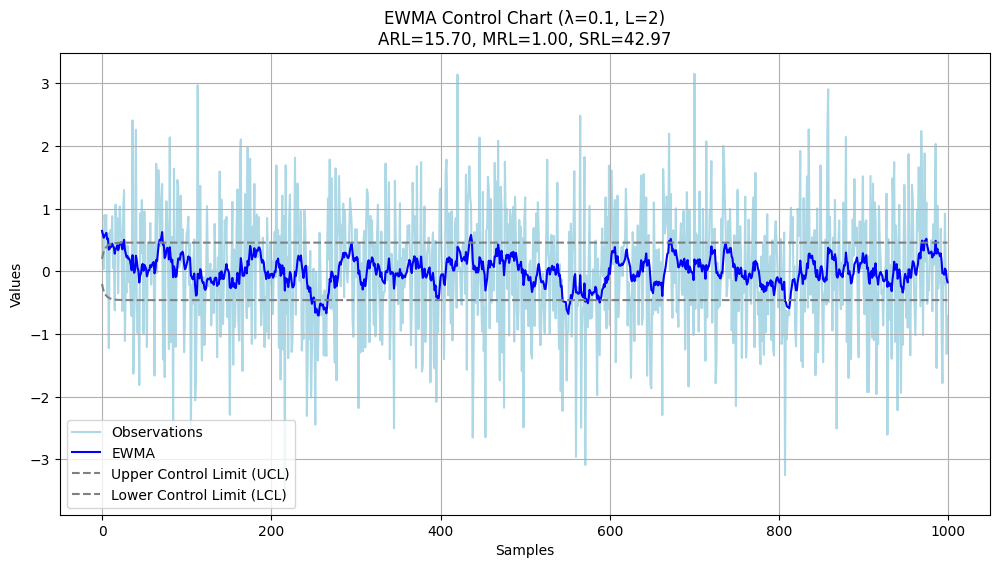

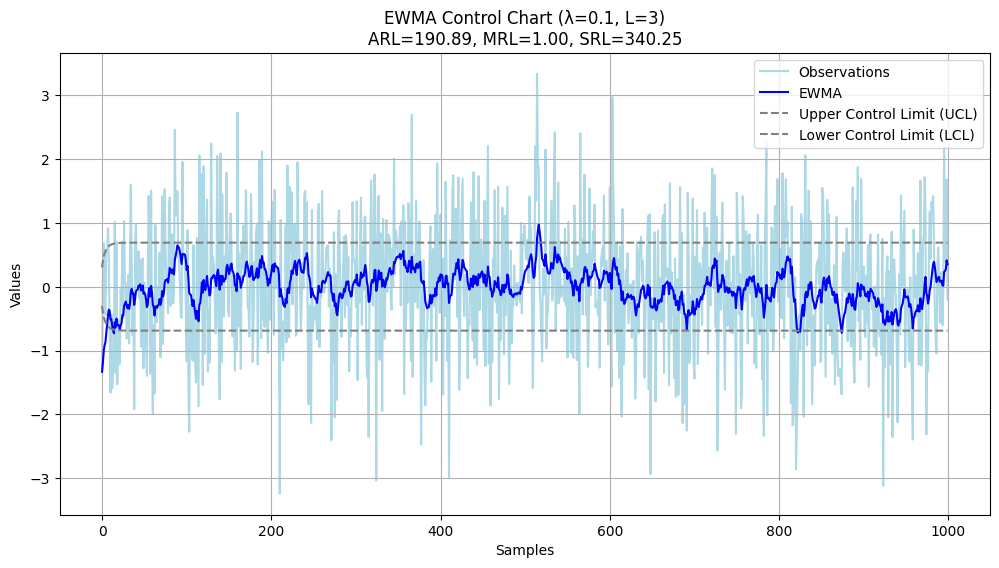

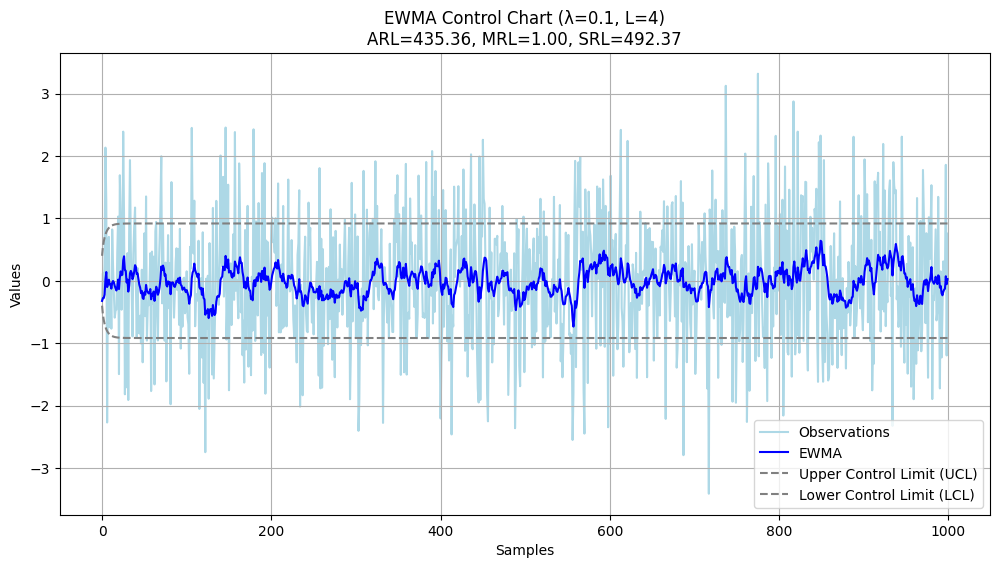

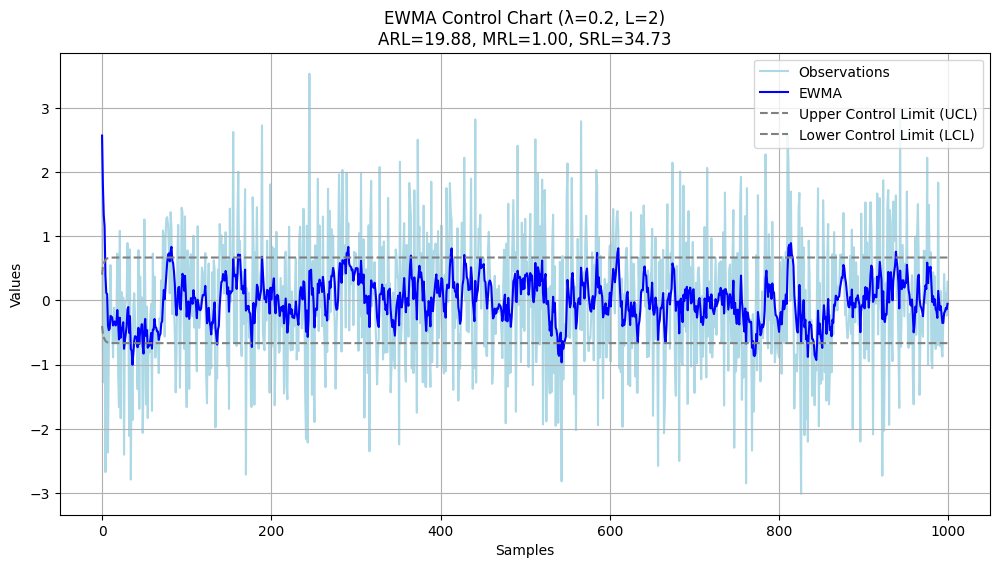

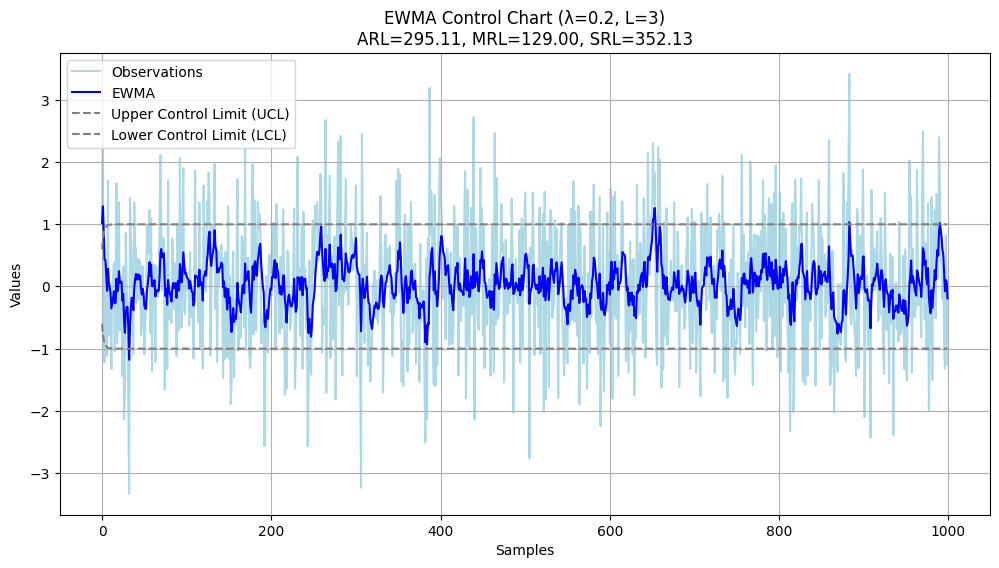

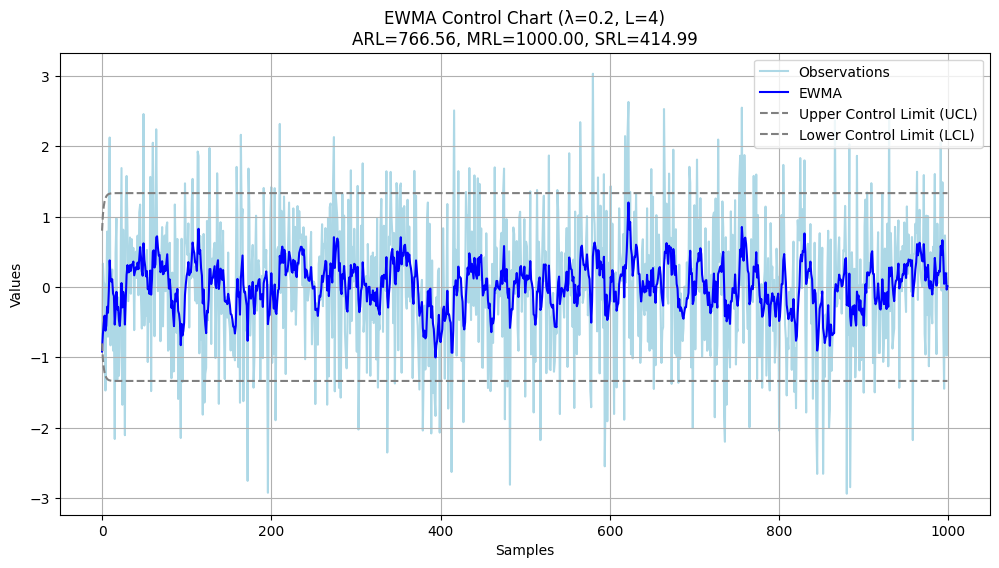

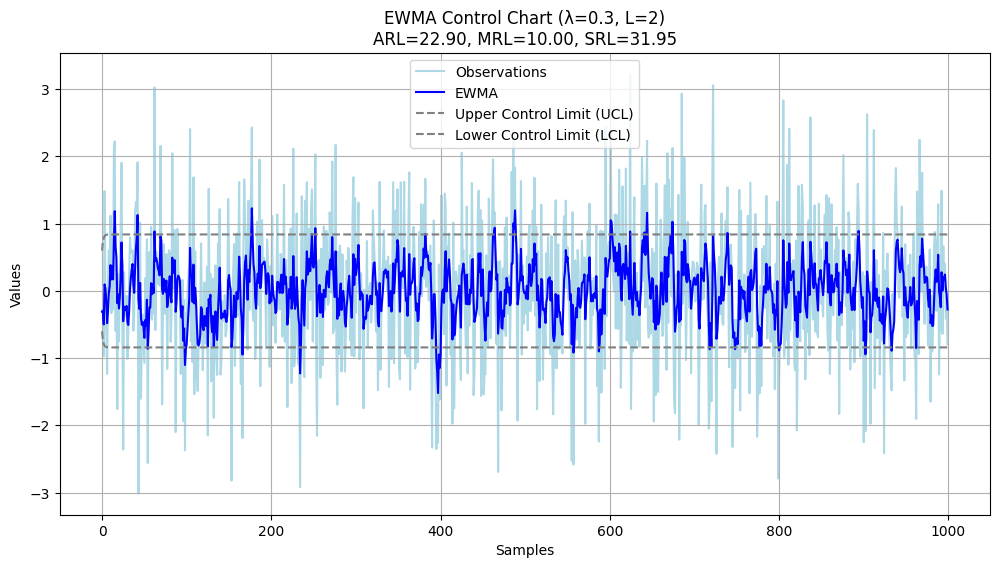

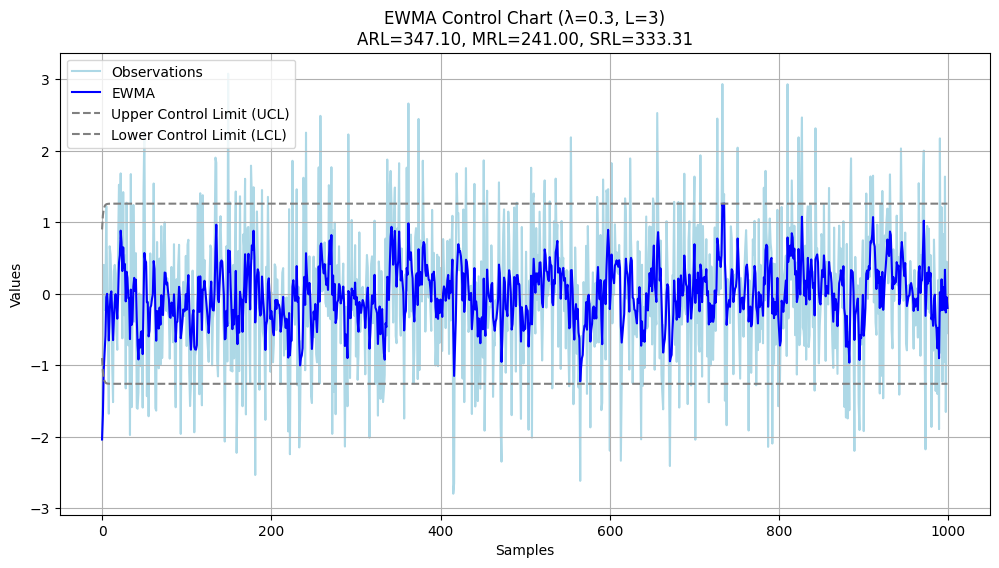

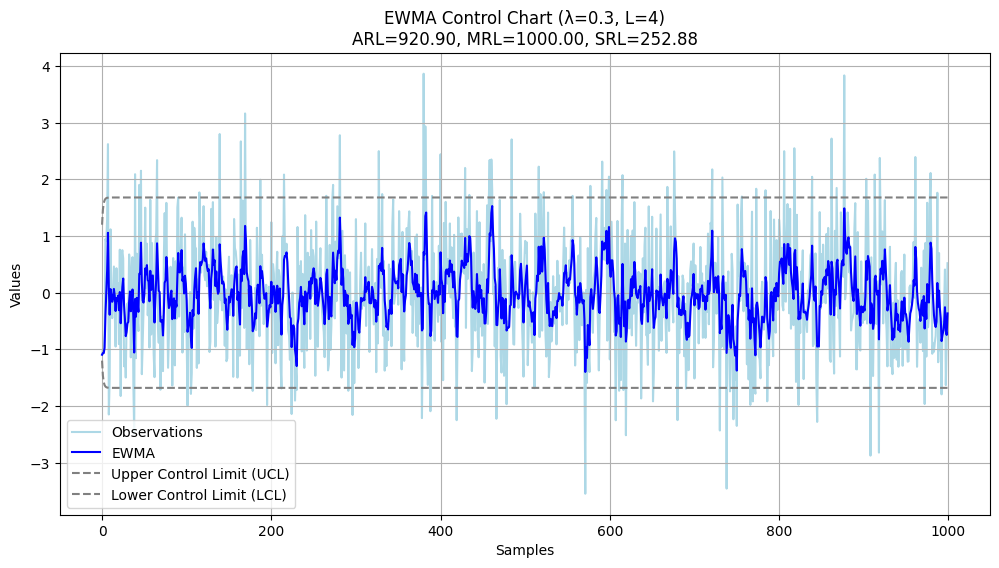

   Lambda  L       ARL     MRL         SRL
0     0.1  2   15.7026     1.0   42.967173
1     0.1  3  190.8864     1.0  340.248240
2     0.1  4  435.3617     1.0  492.373034
3     0.2  2   19.8810     1.0   34.732510
4     0.2  3  295.1090   129.0  352.131635
5     0.2  4  766.5640  1000.0  414.985295
6     0.3  2   22.9000    10.0   31.946487
7     0.3  3  347.0967   241.0  333.307837
8     0.3  4  920.9033  1000.0  252.880385


In [55]:
import numpy as np
import matplotlib.pyplot as plt

# Função para calcular o EWMA
def calculate_ewma(observations, lambda_):
    ewma = np.zeros_like(observations)
    ewma[0] = observations[0]
    for t in range(1, len(observations)):
        ewma[t] = lambda_ * observations[t] + (1 - lambda_) * ewma[t - 1]
    return ewma

# Função para calcular os limites de controle
def calculate_control_limits(mu_0, sigma, lambda_, L, n):
    ucl = mu_0 + L * sigma * np.sqrt((lambda_ / (2 - lambda_)) * (1 - (1 - lambda_)**(2 * (np.arange(n) + 1))))
    lcl = mu_0 - L * sigma * np.sqrt((lambda_ / (2 - lambda_)) * (1 - (1 - lambda_)**(2 * (np.arange(n) + 1))))
    return ucl, lcl

# Função para realizar uma simulação de Monte Carlo
def monte_carlo_simulation(lambda_, L, mu_0, sigma, num_simulations, max_run_length):
    run_lengths = []
    for _ in range(num_simulations):
        observations = np.random.normal(mu_0, sigma, max_run_length)
        ewma = calculate_ewma(observations, lambda_)
        ucl, lcl = calculate_control_limits(mu_0, sigma, lambda_, L, max_run_length)
        
        for t in range(1, max_run_length):
            if ewma[t] > ucl[t] or ewma[t] < lcl[t]:
                run_lengths.append(t)
                break
        else:
            run_lengths.append(max_run_length)
    return run_lengths

# Parâmetros iniciais
mu_0 = 0
sigma = 1
num_simulations = 10000
max_run_length = 1000
lambdas = [0.1, 0.2, 0.3]
Ls = [2, 3, 4]

# Executar simulações para cada combinação de lambda e L
results = []

for lambda_ in lambdas:
    for L in Ls:
        run_lengths = monte_carlo_simulation(lambda_, L, mu_0, sigma, num_simulations, max_run_length)
        ARL = np.mean(run_lengths)
        MRL = np.median(run_lengths)
        SRL = np.std(run_lengths)
        results.append((lambda_, L, ARL, MRL, SRL))

# Plotar gráficos de controle para cada combinação
for lambda_, L, ARL, MRL, SRL in results:
    observations = np.random.normal(mu_0, sigma, max_run_length)
    ewma = calculate_ewma(observations, lambda_)
    ucl, lcl = calculate_control_limits(mu_0, sigma, lambda_, L, max_run_length)

    plt.figure(figsize=(12, 6))
    plt.plot(observations, label='Observations', color='lightblue', zorder=1)
    plt.plot(ewma, label='EWMA', color='blue', zorder=2)
    plt.plot(ucl, 'r--', label='Upper Control Limit (UCL)', color='gray', zorder=3)
    plt.plot(lcl, 'r--', label='Lower Control Limit (LCL)', color='gray', zorder=3)
    plt.xlabel('Samples')
    plt.ylabel('Values')
    plt.title(f'EWMA Control Chart (λ={lambda_}, L={L})\nARL={ARL:.2f}, MRL={MRL:.2f}, SRL={SRL:.2f}')
    plt.legend()
    plt.grid(True)
    plt.show()

# Exibir resultados
import pandas as pd

results_df = pd.DataFrame(results, columns=['Lambda', 'L', 'ARL', 'MRL', 'SRL'])
print(results_df)


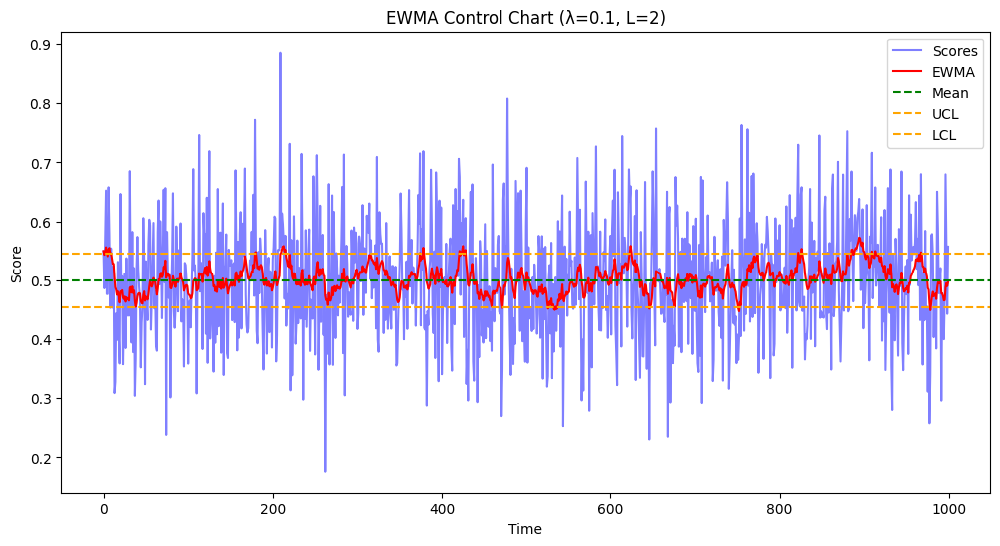

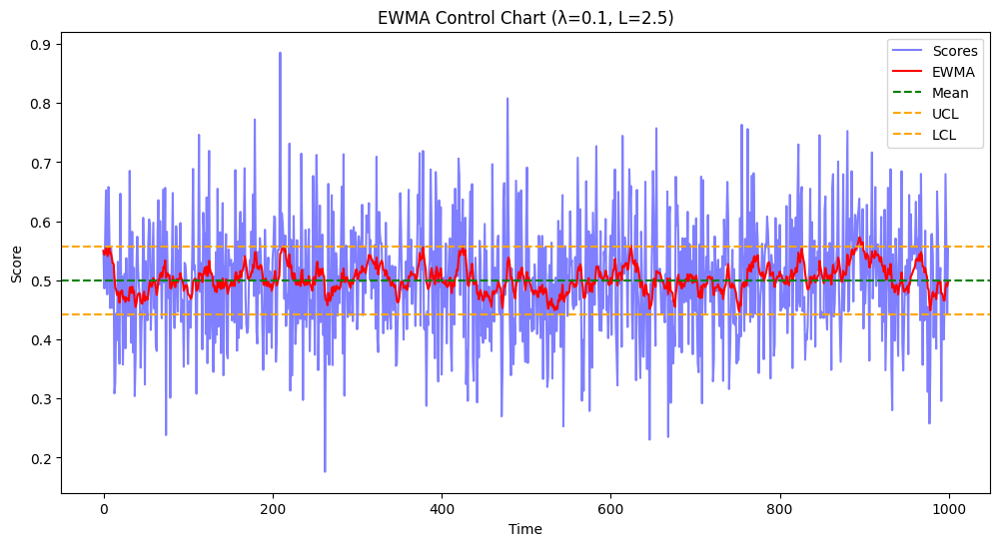

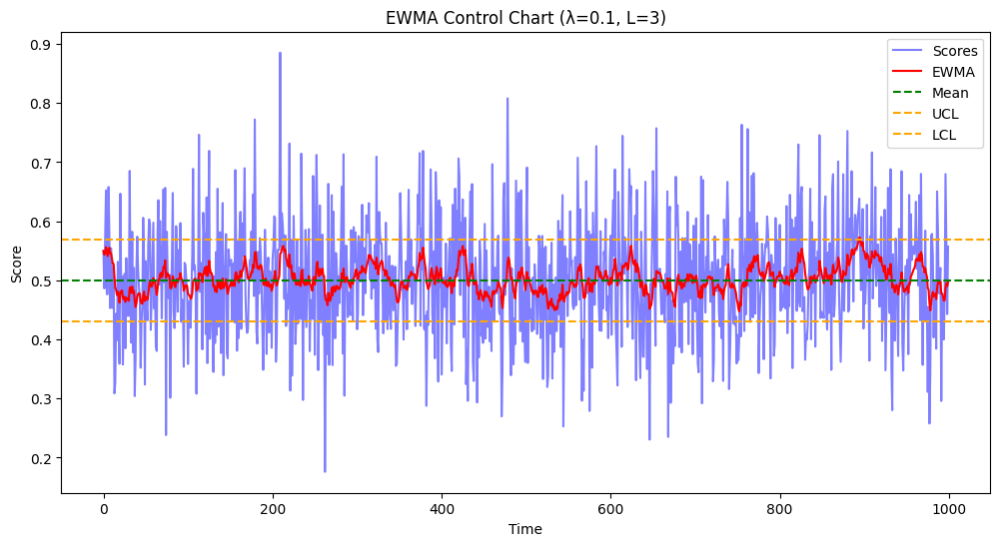

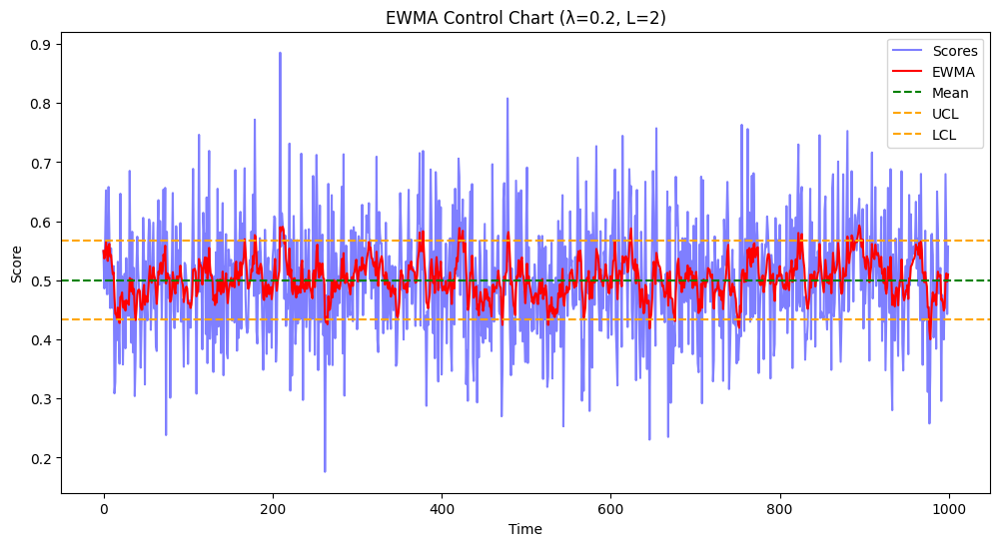

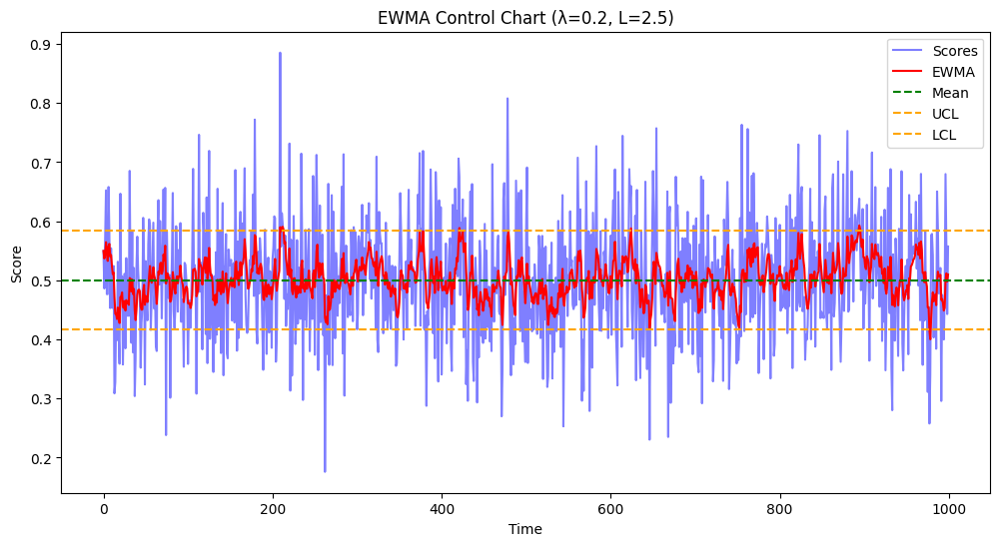

...

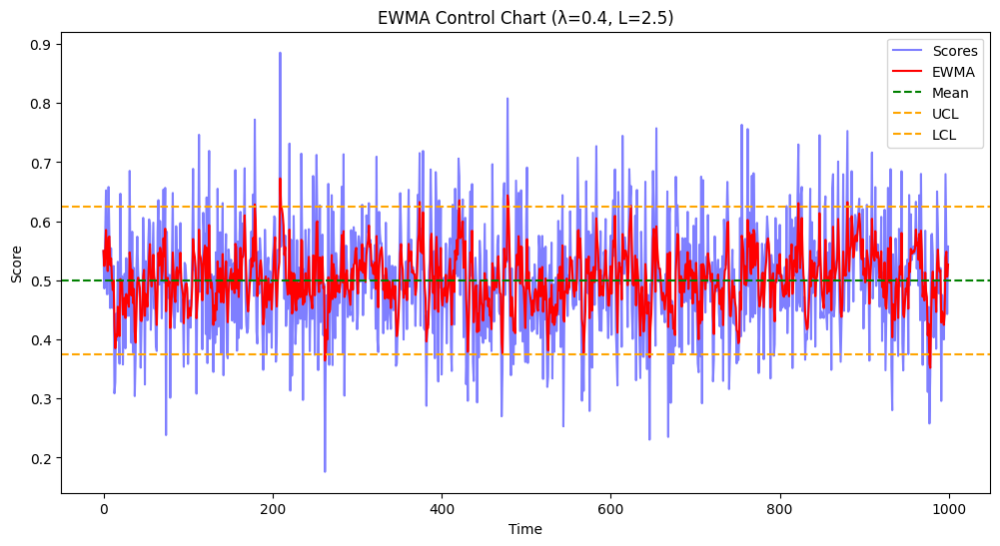

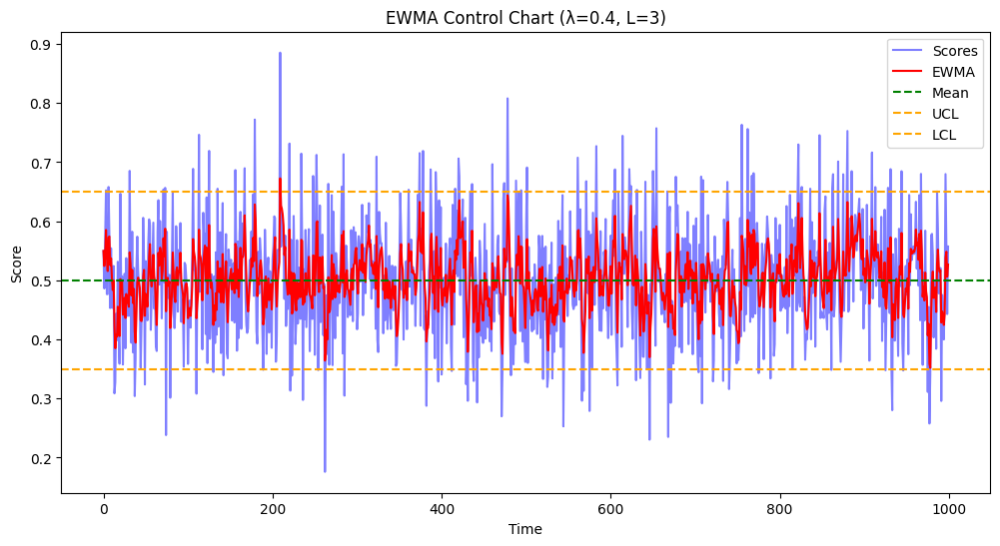

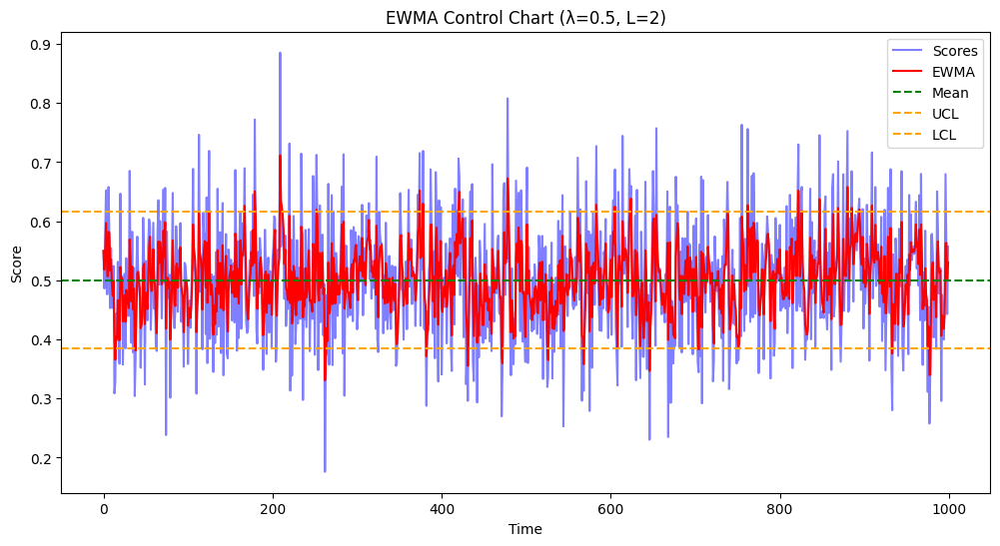

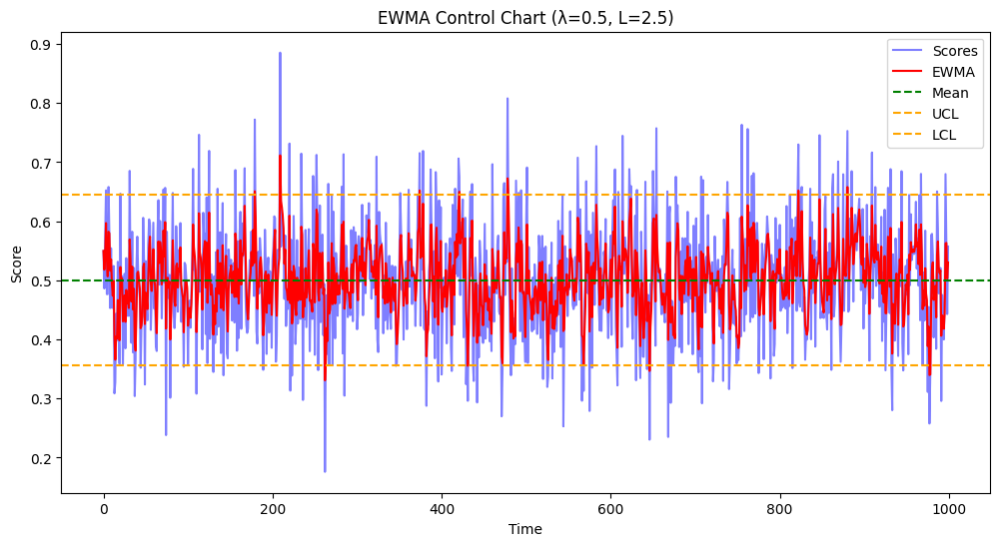

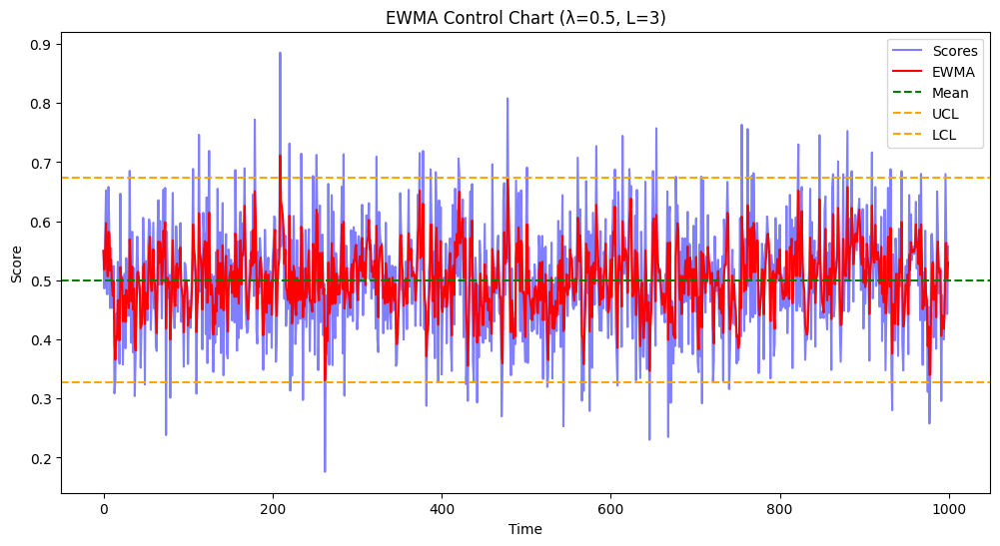

    Lambda    L      ARL    MRL         SRL
0      0.1  2.0   22.046    1.0   49.644092
1      0.1  2.5   91.545    1.0  170.396291
2      0.1  3.0  264.427    1.0  373.312698
3      0.2  2.0   22.019    2.0   35.928326
4      0.2  2.5   82.508   25.0  126.435137
5      0.2  3.0  312.968  163.5  353.057801
6      0.3  2.0   20.210    6.0   28.807046
7      0.3  2.5   80.333   34.0  109.720637
8      0.3  3.0  311.322  197.0  329.069625
9      0.4  2.0   20.436   10.0   27.237362
10     0.4  2.5   81.136   46.0  101.576885
11     0.4  3.0  329.763  237.5  318.430584
12     0.5  2.0   22.401   14.0   26.894873
13     0.5  2.5   75.380   48.0   85.351752
14     0.5  3.0  334.902  243.5  305.915669


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Parâmetros de simulação
np.random.seed(42)
n = 1000  # Número de pontos na série temporal
mu = 0.5  # Média dos scores
sigma = 0.1  # Desvio padrão dos scores

# Gerar série temporal de scores do Isolation Forest
scores = np.random.normal(mu, sigma, n)

def calculate_ewma(scores, lambda_):
    Z = np.zeros_like(scores)
    Z[0] = scores[0]
    for t in range(1, len(scores)):
        Z[t] = lambda_ * scores[t] + (1 - lambda_) * Z[t - 1]
    return Z

def calculate_control_limits(mu, sigma, lambda_, L):
    std_dev = sigma * np.sqrt(lambda_ / (2 - lambda_))
    UCL = mu + L * std_dev
    LCL = mu - L * std_dev
    return UCL, LCL

# Plotar carta de controle
def plot_control_chart(scores, ewma, UCL, LCL, lambda_, L):
    plt.figure(figsize=(12, 6))
    plt.plot(scores, label='Scores', color='blue', alpha=0.5)
    plt.plot(ewma, label='EWMA', color='red')
    plt.axhline(y=mu, color='green', linestyle='--', label='Mean')
    plt.axhline(y=UCL, color='orange', linestyle='--', label='UCL')
    plt.axhline(y=LCL, color='orange', linestyle='--', label='LCL')
    plt.title(f'EWMA Control Chart (λ={lambda_}, L={L})')
    plt.xlabel('Time')
    plt.ylabel('Score')
    plt.legend()
    plt.show()

# Simulação de Monte Carlo para análise de sensibilidade
def monte_carlo_simulation(lambda_, L, mu, sigma, num_simulations=1000):
    run_lengths = []
    for _ in range(num_simulations):
        scores = np.random.normal(mu, sigma, n)
        ewma = calculate_ewma(scores, lambda_)
        UCL, LCL = calculate_control_limits(mu, sigma, lambda_, L)
        out_of_control = np.where((ewma > UCL) | (ewma < LCL))[0]
        if len(out_of_control) == 0:
            run_lengths.append(n)  # No points out of control
        else:
            run_lengths.append(out_of_control[0] + 1)
    ARL = np.mean(run_lengths)
    MRL = np.median(run_lengths)
    SRL = np.std(run_lengths)
    return ARL, MRL, SRL

# Parâmetros para análise de sensibilidade
lambdas = [0.1, 0.2, 0.3, 0.4, 0.5]
Ls = [2, 2.5, 3]

# Resultados da análise de sensibilidade
results = []

for lambda_ in lambdas:
    for L in Ls:
        ewma = calculate_ewma(scores, lambda_)
        UCL, LCL = calculate_control_limits(mu, sigma, lambda_, L)
        ARL, MRL, SRL = monte_carlo_simulation(lambda_, L, mu, sigma)
        results.append([lambda_, L, ARL, MRL, SRL])
        # Plotar carta de controle para cada combinação de parâmetros
        plot_control_chart(scores, ewma, UCL, LCL, lambda_, L)

# Guardar resultados numa tabela
results_df = pd.DataFrame(results, columns=['Lambda', 'L', 'ARL', 'MRL', 'SRL'])
print(results_df)


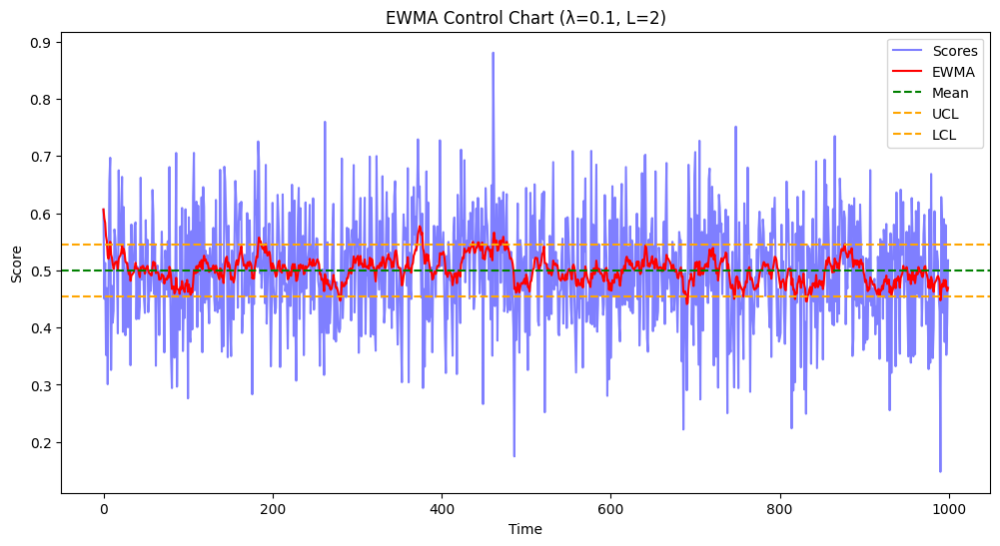

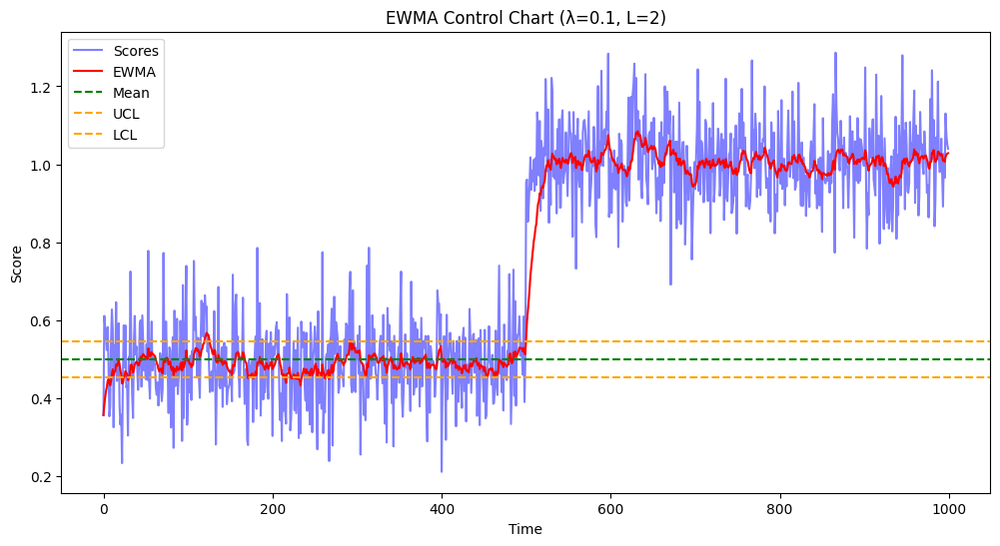

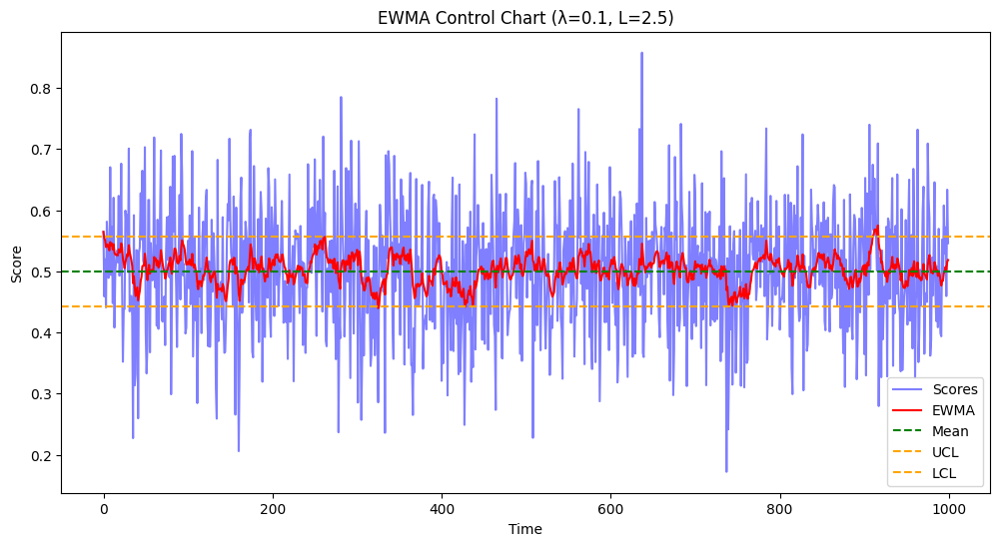

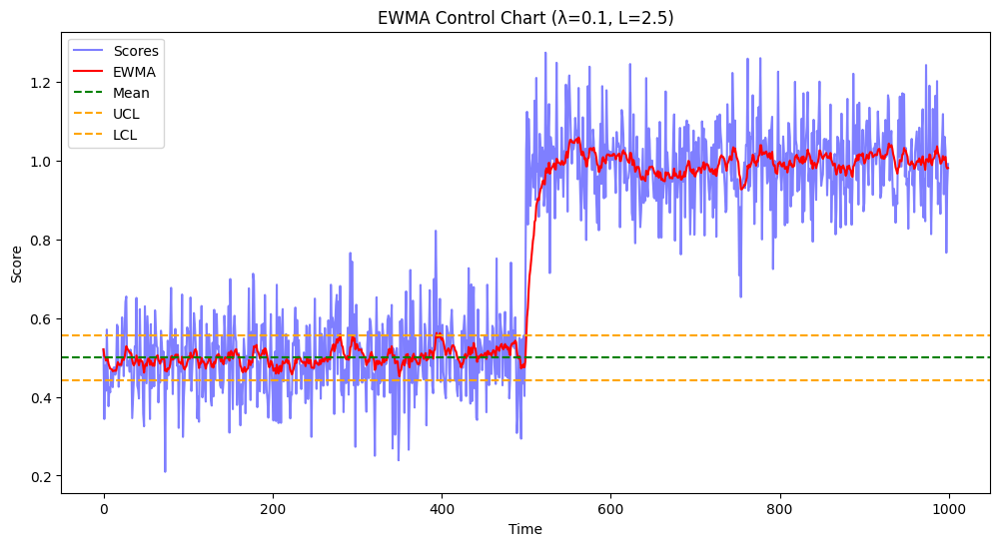

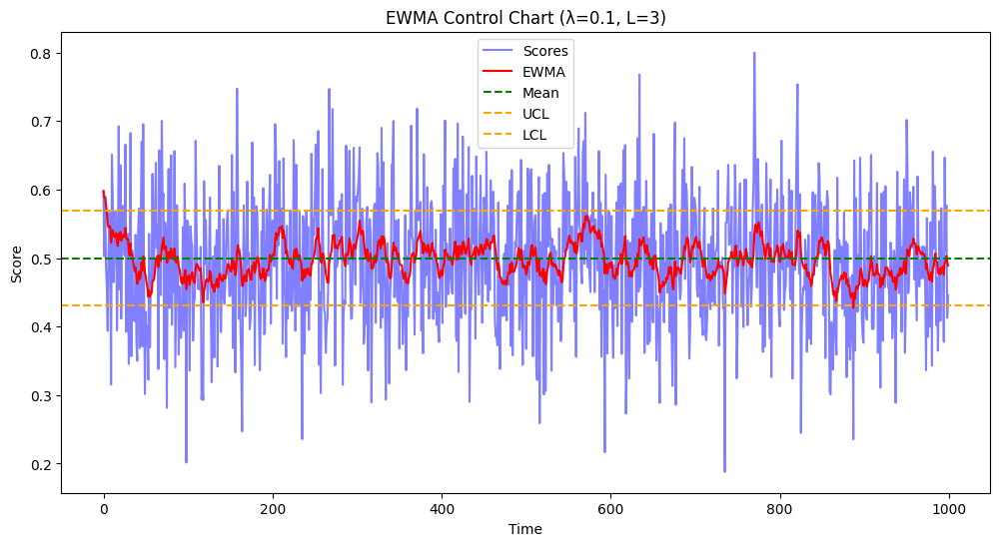

...

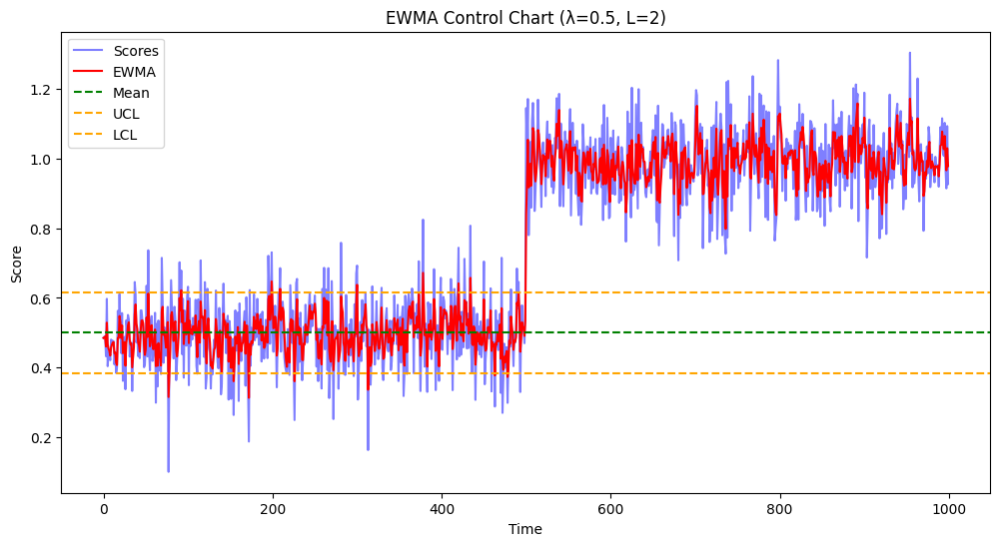

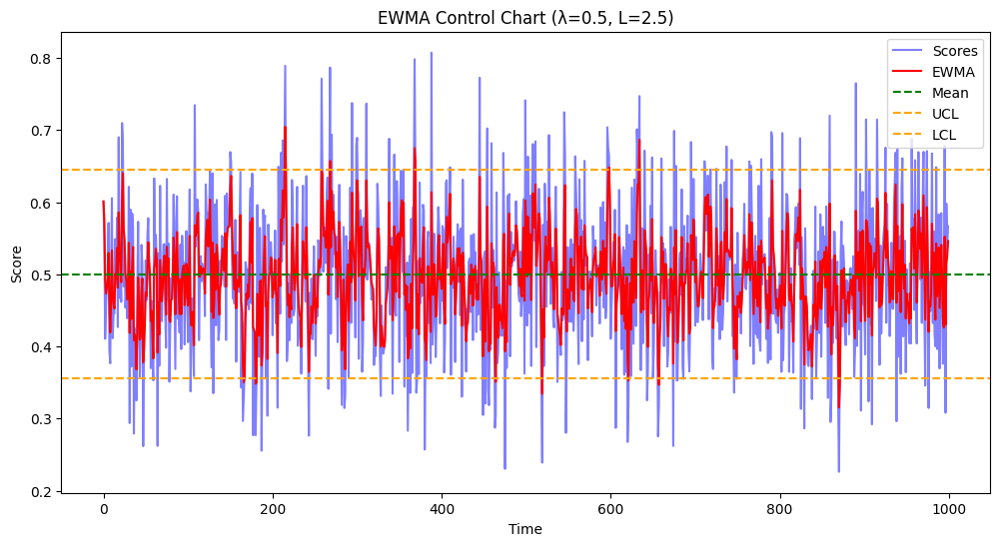

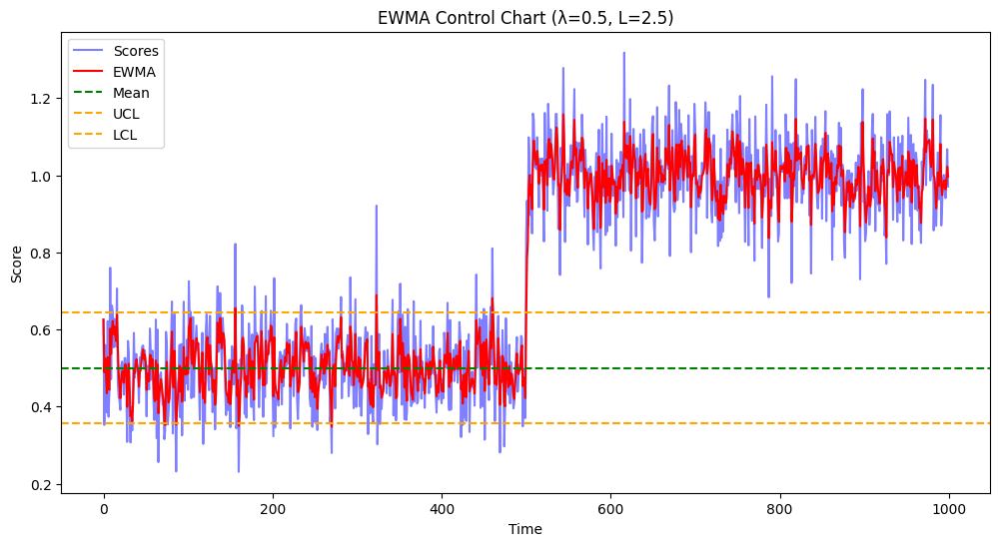

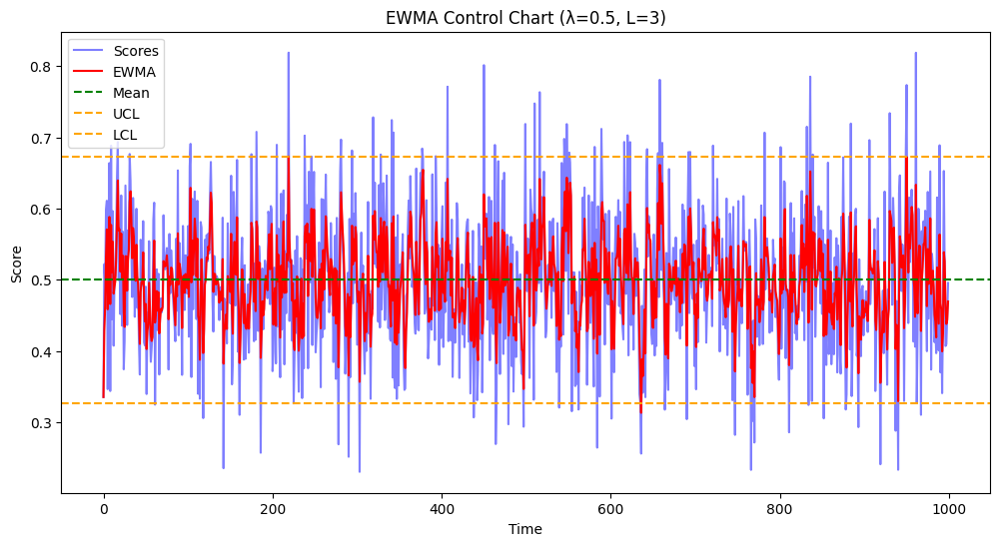

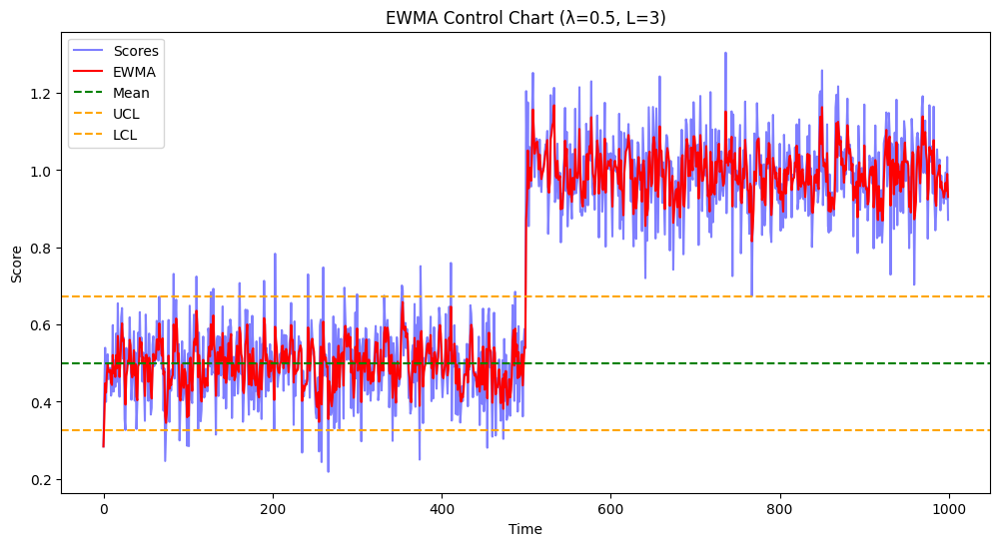

Resultados sob controle:
    Lambda    L   ARL_in  MRL_in      SRL_in
0      0.1  2.0   21.916     1.0   49.528688
1      0.1  2.5   89.540     1.0  177.395165
2      0.1  3.0  307.887    10.0  393.909470
3      0.2  2.0   20.492     1.0   34.111200
4      0.2  2.5   75.435    22.0  117.848164
5      0.2  3.0  305.835   161.0  349.255101
6      0.3  2.0   22.050     8.0   30.765785
7      0.3  2.5   77.363    37.0  107.575486
8      0.3  3.0  314.390   187.0  332.415553
9      0.4  2.0   18.526     8.0   25.230246
10     0.4  2.5   78.571    47.0   98.459276
11     0.4  3.0  324.950   218.0  319.158712
12     0.5  2.0   20.594    12.0   24.082051
13     0.5  2.5   76.037    46.0   87.786683
14     0.5  3.0  327.942   227.0  310.467977

Resultados fora de controle:
    Lambda    L  ARL_out  MRL_out     SRL_out
0      0.1  2.0   24.005      1.0   52.929302
1      0.1  2.5   82.469      1.0  142.705925
2      0.1  3.0  194.696      2.0  227.512478
3      0.2  2.0   21.685      1.5   38.27

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Parâmetros de simulação
np.random.seed(42)
n = 1000  # Número de pontos na série temporal
mu = 0.5  # Média dos scores sob controle
sigma = 0.1  # Desvio padrão dos scores sob controle
anomaly_mu = 1.0  # Média dos scores fora de controle

# Função para calcular EWMA
def calculate_ewma(scores, lambda_):
    Z = np.zeros_like(scores)
    Z[0] = scores[0]
    for t in range(1, len(scores)):
        Z[t] = lambda_ * scores[t] + (1 - lambda_) * Z[t - 1]
    return Z

# Função para calcular limites de controle
def calculate_control_limits(mu, sigma, lambda_, L):
    std_dev = sigma * np.sqrt(lambda_ / (2 - lambda_))
    UCL = mu + L * std_dev
    LCL = mu - L * std_dev
    return UCL, LCL

# Função para plotar carta de controle
def plot_control_chart(scores, ewma, UCL, LCL, lambda_, L):
    plt.figure(figsize=(12, 6))
    plt.plot(scores, label='Scores', color='blue', alpha=0.5)
    plt.plot(ewma, label='EWMA', color='red')
    plt.axhline(y=mu, color='green', linestyle='--', label='Mean')
    plt.axhline(y=UCL, color='orange', linestyle='--', label='UCL')
    plt.axhline(y=LCL, color='orange', linestyle='--', label='LCL')
    plt.title(f'EWMA Control Chart (λ={lambda_}, L={L})')
    plt.xlabel('Time')
    plt.ylabel('Score')
    plt.legend()
    plt.show()

# Simulação de Monte Carlo para análise de sensibilidade
def monte_carlo_simulation(lambda_, L, mu, sigma, anomaly_mu, num_simulations=1000, in_control=True):
    run_lengths = []
    for _ in range(num_simulations):
        if in_control:
            scores = np.random.normal(mu, sigma, n)
        else:
            scores = np.concatenate([np.random.normal(mu, sigma, n//2), np.random.normal(anomaly_mu, sigma, n//2)])
        
        ewma = calculate_ewma(scores, lambda_)
        UCL, LCL = calculate_control_limits(mu, sigma, lambda_, L)
        out_of_control = np.where((ewma > UCL) | (ewma < LCL))[0]
        if len(out_of_control) == 0:
            run_lengths.append(n)  # No points out of control
        else:
            run_lengths.append(out_of_control[0] + 1)
    ARL = np.mean(run_lengths)
    MRL = np.median(run_lengths)
    SRL = np.std(run_lengths)
    return ARL, MRL, SRL

# Parâmetros para análise de sensibilidade
lambdas = [0.1, 0.2, 0.3, 0.4, 0.5]
Ls = [2, 2.5, 3]

# Resultados da análise de sensibilidade
results_in_control = []
results_out_of_control = []

for lambda_ in lambdas:
    for L in Ls:
        ewma = calculate_ewma(scores, lambda_)
        UCL, LCL = calculate_control_limits(mu, sigma, lambda_, L)
        ARL_in, MRL_in, SRL_in = monte_carlo_simulation(lambda_, L, mu, sigma, anomaly_mu, in_control=True)
        ARL_out, MRL_out, SRL_out = monte_carlo_simulation(lambda_, L, mu, sigma, anomaly_mu, in_control=False)
        results_in_control.append([lambda_, L, ARL_in, MRL_in, SRL_in])
        results_out_of_control.append([lambda_, L, ARL_out, MRL_out, SRL_out])
        # Plotar carta de controle para dados sob controle
        scores_in_control = np.random.normal(mu, sigma, n)
        ewma_in_control = calculate_ewma(scores_in_control, lambda_)
        plot_control_chart(scores_in_control, ewma_in_control, UCL, LCL, lambda_, L)
        # Plotar carta de controle para dados fora de controle
        scores_out_of_control = np.concatenate([np.random.normal(mu, sigma, n//2), np.random.normal(anomaly_mu, sigma, n//2)])
        ewma_out_of_control = calculate_ewma(scores_out_of_control, lambda_)
        plot_control_chart(scores_out_of_control, ewma_out_of_control, UCL, LCL, lambda_, L)

# Guardar resultados numa tabela
results_df_in_control = pd.DataFrame(results_in_control, columns=['Lambda', 'L', 'ARL_in', 'MRL_in', 'SRL_in'])
results_df_out_of_control = pd.DataFrame(results_out_of_control, columns=['Lambda', 'L', 'ARL_out', 'MRL_out', 'SRL_out'])

print("Resultados sob controle:")
print(results_df_in_control)
print("\nResultados fora de controle:")
print(results_df_out_of_control)


Melhor cenário: λ=0.1, L=3.0, ARL_in=308.032, ARL_out=194.336


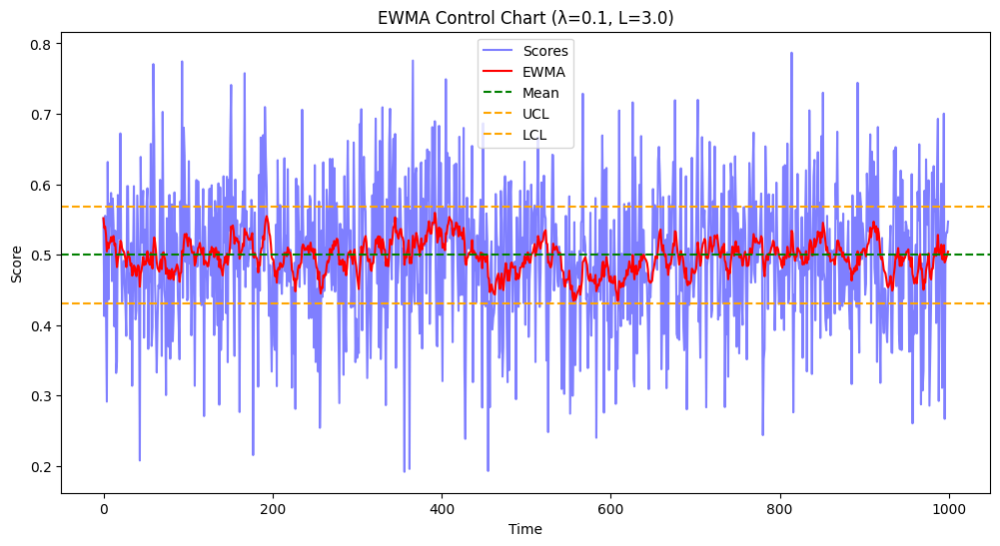

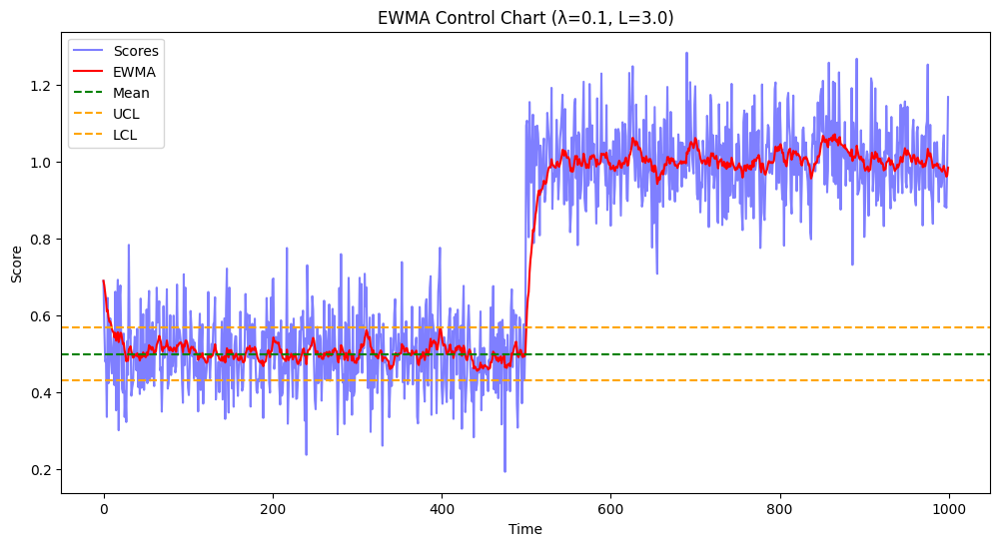

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Parâmetros de simulação
np.random.seed(42)
n = 1000  # Número de pontos na série temporal
mu = 0.5  # Média dos scores sob controle
sigma = 0.1  # Desvio padrão dos scores sob controle
anomaly_mu = 1.0  # Média dos scores fora de controle

# Função para calcular EWMA
def calculate_ewma(scores, lambda_):
    Z = np.zeros_like(scores)
    Z[0] = scores[0]
    for t in range(1, len(scores)):
        Z[t] = lambda_ * scores[t] + (1 - lambda_) * Z[t - 1]
    return Z

# Função para calcular limites de controle
def calculate_control_limits(mu, sigma, lambda_, L):
    std_dev = sigma * np.sqrt(lambda_ / (2 - lambda_))
    UCL = mu + L * std_dev
    LCL = mu - L * std_dev
    return UCL, LCL

# Função para plotar carta de controle
def plot_control_chart(scores, ewma, UCL, LCL, lambda_, L):
    plt.figure(figsize=(12, 6))
    plt.plot(scores, label='Scores', color='blue', alpha=0.5)
    plt.plot(ewma, label='EWMA', color='red')
    plt.axhline(y=mu, color='green', linestyle='--', label='Mean')
    plt.axhline(y=UCL, color='orange', linestyle='--', label='UCL')
    plt.axhline(y=LCL, color='orange', linestyle='--', label='LCL')
    plt.title(f'EWMA Control Chart (λ={lambda_}, L={L})')
    plt.xlabel('Time')
    plt.ylabel('Score')
    plt.legend()
    plt.show()

# Simulação de Monte Carlo para análise de sensibilidade
def monte_carlo_simulation(lambda_, L, mu, sigma, anomaly_mu, num_simulations=1000, in_control=True):
    run_lengths = []
    for _ in range(num_simulations):
        if in_control:
            scores = np.random.normal(mu, sigma, n)
        else:
            scores = np.concatenate([np.random.normal(mu, sigma, n//2), np.random.normal(anomaly_mu, sigma, n//2)])
        
        ewma = calculate_ewma(scores, lambda_)
        UCL, LCL = calculate_control_limits(mu, sigma, lambda_, L)
        out_of_control = np.where((ewma > UCL) | (ewma < LCL))[0]
        if len(out_of_control) == 0:
            run_lengths.append(n)  # No points out of control
        else:
            run_lengths.append(out_of_control[0] + 1)
    ARL = np.mean(run_lengths)
    MRL = np.median(run_lengths)
    SRL = np.std(run_lengths)
    return ARL, MRL, SRL

# Parâmetros para análise de sensibilidade
lambdas = [0.1, 0.2, 0.3, 0.4, 0.5]
Ls = [2, 2.5, 3]

# Resultados da análise de sensibilidade
results_in_control = []
results_out_of_control = []

for lambda_ in lambdas:
    for L in Ls:
        ARL_in, MRL_in, SRL_in = monte_carlo_simulation(lambda_, L, mu, sigma, anomaly_mu, in_control=True)
        ARL_out, MRL_out, SRL_out = monte_carlo_simulation(lambda_, L, mu, sigma, anomaly_mu, in_control=False)
        results_in_control.append([lambda_, L, ARL_in, MRL_in, SRL_in])
        results_out_of_control.append([lambda_, L, ARL_out, MRL_out, SRL_out])

# Guardar resultados numa tabela
results_df_in_control = pd.DataFrame(results_in_control, columns=['Lambda', 'L', 'ARL_in', 'MRL_in', 'SRL_in'])
results_df_out_of_control = pd.DataFrame(results_out_of_control, columns=['Lambda', 'L', 'ARL_out', 'MRL_out', 'SRL_out'])

# Determinar o melhor cenário (maximizar ARL_in e minimizar ARL_out)
best_scenario = None
best_score = -np.inf

for i in range(len(results_df_in_control)):
    lambda_ = results_df_in_control.iloc[i]['Lambda']
    L = results_df_in_control.iloc[i]['L']
    ARL_in = results_df_in_control.iloc[i]['ARL_in']
    ARL_out = results_df_out_of_control.iloc[i]['ARL_out']
    
    # Score para determinar o melhor cenário (ajustável conforme a necessidade)
    score = ARL_in - ARL_out
    
    if score > best_score:
        best_score = score
        best_scenario = (lambda_, L, ARL_in, ARL_out)

lambda_, L, ARL_in, ARL_out = best_scenario
print(f"Melhor cenário: λ={lambda_}, L={L}, ARL_in={ARL_in}, ARL_out={ARL_out}")

# Gerar dados para o melhor cenário
scores_in_control = np.random.normal(mu, sigma, n)
ewma_in_control = calculate_ewma(scores_in_control, lambda_)
UCL, LCL = calculate_control_limits(mu, sigma, lambda_, L)

# Plotar carta de controle para dados sob controle no melhor cenário
plot_control_chart(scores_in_control, ewma_in_control, UCL, LCL, lambda_, L)

# Gerar dados fora de controle para o melhor cenário
scores_out_of_control = np.concatenate([np.random.normal(mu, sigma, n//2), np.random.normal(anomaly_mu, sigma, n//2)])
ewma_out_of_control = calculate_ewma(scores_out_of_control, lambda_)

# Plotar carta de controle para dados fora de controle no melhor cenário
plot_control_chart(scores_out_of_control, ewma_out_of_control, UCL, LCL, lambda_, L)


In [6]:
scores = np.random.normal(mu, sigma, n)
scores

array([0.58423633, 0.65754832, 0.50352752, 0.51477922, 0.49001345,
       0.45233434, 0.47064028, 0.6200193 , 0.24554674, 0.41703729,
       0.53528806, 0.46733565, 0.34393116, 0.47307841, 0.4615615 ,
       0.40798015, 0.57908785, 0.53489512, 0.40526955, 0.50957909,
       0.64760354, 0.44864175, 0.49068086, 0.70353986, 0.4774587 ,
       0.47341944, 0.48242626, 0.3807797 , 0.64663924, 0.59969335,
       0.64341175, 0.58791003, 0.56175435, 0.53803805, 0.41888948,
       0.43665453, 0.47393318, 0.49121582, 0.43872713, 0.4777876 ,
       0.52670113, 0.72438475, 0.51962877, 0.51734836, 0.54019741,
       0.540835  , 0.4340944 , 0.4954917 , 0.49993567, 0.66454166,
       0.33665313, 0.38979782, 0.64149384, 0.40938075, 0.45493943,
       0.63779938, 0.4614979 , 0.48716873, 0.45513213, 0.37473868,
       0.39310942, 0.56264211, 0.59390169, 0.34404867, 0.36087006,
       0.54513515, 0.49323267, 0.65074912, 0.46936192, 0.48476739,
       0.65128115, 0.44483798, 0.53914097, 0.63728829, 0.47013

Melhor cenário: λ=0.5, L=3.0, ARL_in=309.392, ARL_out=114.503


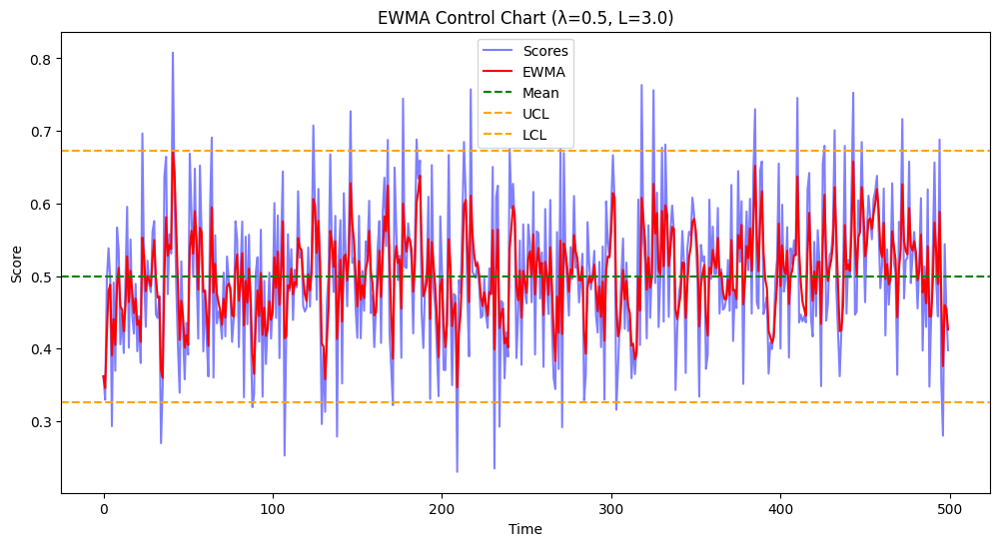

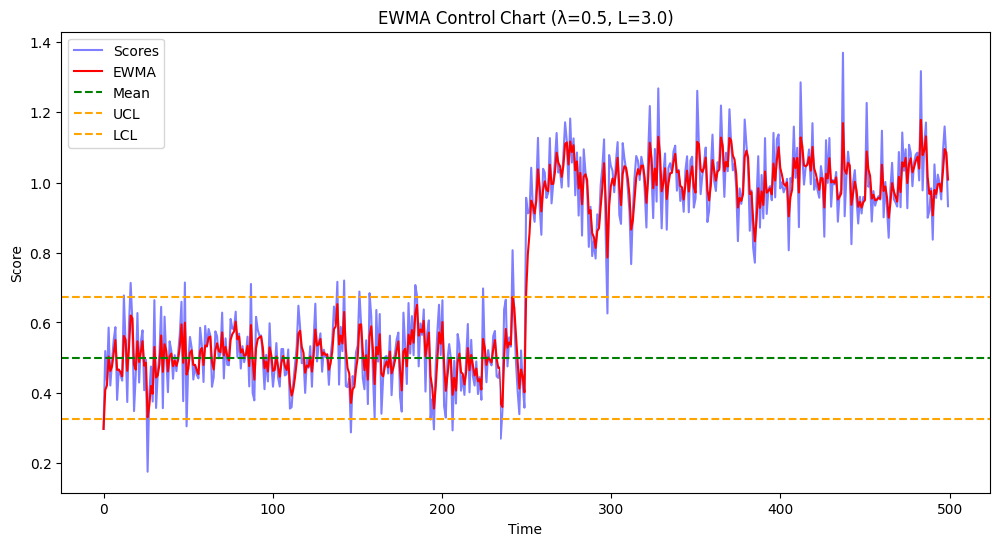

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Parâmetros de simulação
np.random.seed(42)
n = 1000  # Número de pontos na série temporal
mu = 0.5  # Média dos scores sob controle
sigma = 0.1  # Desvio padrão dos scores sob controle
anomaly_mu = 1.0  # Média dos scores fora de controle

# Gerar série temporal de scores do Isolation Forest (exemplo)
scores = np.random.normal(mu, sigma, n)

# Função para calcular EWMA
def calculate_ewma(scores, lambda_):
    Z = np.zeros_like(scores)
    Z[0] = scores[0]
    for t in range(1, len(scores)):
        Z[t] = lambda_ * scores[t] + (1 - lambda_) * Z[t - 1]
    return Z

# Função para calcular limites de controle
def calculate_control_limits(mu, sigma, lambda_, L):
    std_dev = sigma * np.sqrt(lambda_ / (2 - lambda_))
    UCL = mu + L * std_dev
    LCL = mu - L * std_dev
    return UCL, LCL

# Função para plotar carta de controle
def plot_control_chart(scores, ewma, UCL, LCL, lambda_, L):
    plt.figure(figsize=(12, 6))
    plt.plot(scores, label='Scores', color='blue', alpha=0.5)
    plt.plot(ewma, label='EWMA', color='red')
    plt.axhline(y=mu, color='green', linestyle='--', label='Mean')
    plt.axhline(y=UCL, color='orange', linestyle='--', label='UCL')
    plt.axhline(y=LCL, color='orange', linestyle='--', label='LCL')
    plt.title(f'EWMA Control Chart (λ={lambda_}, L={L})')
    plt.xlabel('Time')
    plt.ylabel('Score')
    plt.legend()
    plt.show()

# Simulação de Monte Carlo com técnica de deslizamento
def monte_carlo_simulation(scores, lambda_, L, mu, sigma, anomaly_mu, window_size, num_simulations=1000, in_control=True):
    run_lengths = []
    n = len(scores)
    for _ in range(num_simulations):
        if in_control:
            start_idx = np.random.randint(0, n - window_size)
            sample_scores = scores[start_idx:start_idx + window_size]
        else:
            start_idx = np.random.randint(0, n//2 - window_size//2)
            sample_scores = np.concatenate([scores[start_idx:start_idx + window_size//2], np.random.normal(anomaly_mu, sigma, window_size//2)])
        
        ewma = calculate_ewma(sample_scores, lambda_)
        UCL, LCL = calculate_control_limits(mu, sigma, lambda_, L)
        out_of_control = np.where((ewma > UCL) | (ewma < LCL))[0]
        if len(out_of_control) == 0:
            run_lengths.append(window_size)  # No points out of control
        else:
            run_lengths.append(out_of_control[0] + 1)
    ARL = np.mean(run_lengths)
    MRL = np.median(run_lengths)
    SRL = np.std(run_lengths)
    return ARL, MRL, SRL

# Parâmetros para análise de sensibilidade
lambdas = [0.1, 0.2, 0.3, 0.4, 0.5]
Ls = [2, 2.5, 3]
window_size = 500  # Tamanho da janela deslizante

# Resultados da análise de sensibilidade
results_in_control = []
results_out_of_control = []

for lambda_ in lambdas:
    for L in Ls:
        ARL_in, MRL_in, SRL_in = monte_carlo_simulation(scores, lambda_, L, mu, sigma, anomaly_mu, window_size, in_control=True)
        ARL_out, MRL_out, SRL_out = monte_carlo_simulation(scores, lambda_, L, mu, sigma, anomaly_mu, window_size, in_control=False)
        results_in_control.append([lambda_, L, ARL_in, MRL_in, SRL_in])
        results_out_of_control.append([lambda_, L, ARL_out, MRL_out, SRL_out])

# Guardar resultados numa tabela
results_df_in_control = pd.DataFrame(results_in_control, columns=['Lambda', 'L', 'ARL_in', 'MRL_in', 'SRL_in'])
results_df_out_of_control = pd.DataFrame(results_out_of_control, columns=['Lambda', 'L', 'ARL_out', 'MRL_out', 'SRL_out'])

# Determinar o melhor cenário (maximizar ARL_in e minimizar ARL_out)
best_scenario = None
best_score = -np.inf

for i in range(len(results_df_in_control)):
    lambda_ = results_df_in_control.iloc[i]['Lambda']
    L = results_df_in_control.iloc[i]['L']
    ARL_in = results_df_in_control.iloc[i]['ARL_in']
    ARL_out = results_df_out_of_control.iloc[i]['ARL_out']
    
    # Score para determinar o melhor cenário (ajustável conforme a necessidade)
    score = ARL_in - ARL_out
    
    if score > best_score:
        best_score = score
        best_scenario = (lambda_, L, ARL_in, ARL_out)

lambda_, L, ARL_in, ARL_out = best_scenario
print(f"Melhor cenário: λ={lambda_}, L={L}, ARL_in={ARL_in}, ARL_out={ARL_out}")

# Gerar dados para o melhor cenário
start_idx = np.random.randint(0, n - window_size)
scores_in_control = scores[start_idx:start_idx + window_size]
ewma_in_control = calculate_ewma(scores_in_control, lambda_)
UCL, LCL = calculate_control_limits(mu, sigma, lambda_, L)

# Plotar carta de controle para dados sob controle no melhor cenário
plot_control_chart(scores_in_control, ewma_in_control, UCL, LCL, lambda_, L)

# Gerar dados fora de controle para o melhor cenário
start_idx = np.random.randint(0, n//2 - window_size//2)
scores_out_of_control = np.concatenate([scores[start_idx:start_idx + window_size//2], np.random.normal(anomaly_mu, sigma, window_size//2)])
ewma_out_of_control = calculate_ewma(scores_out_of_control, lambda_)

# Plotar carta de controle para dados fora de controle no melhor cenário
plot_control_chart(scores_out_of_control, ewma_out_of_control, UCL, LCL, lambda_, L)
